# [OpenCV](https://docs.opencv.org/4.2.0/d6/d00/tutorial_py_root.html)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import cv2
import time

In [2]:
print(cv2.__version__)

4.5.5


In [3]:
# 寫個函數方便之後使用
def show_(img, s=5):  # show the image
    img = img.copy()
    img = img.clip(0, 255)
    img = img.astype(np.uint8)
    plt.figure(figsize=(s, s))
    if img.ndim == 3:  # color image
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV 的色彩空間 BRG
        plt.imshow(img)
    else:  # gray image
        plt.imshow(img, cmap='gray')
    plt.xticks([]), plt.yticks([])
    plt.show()
    
def img_info(arr, text=None):
    if text:
        print(text)
    print(f'shape: {arr.shape}\nmin: {arr.min()}\nmax: {arr.max()}\nmean: {arr.mean()}\nstd: {arr.std()}\ndtype: {arr.dtype}\n')


# 圖片
### [`cv2.imread(file_name, flag)`](https://docs.opencv.org/4.2.0/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56)

|[__flag__](https://docs.opencv.org/4.2.0/d4/da8/group__imgcodecs.html#gga61d9b0126a3e57d9277ac48327799c80af660544735200cbe942eea09232eb822)| / |
| ---------------------- | ----------- |
| `cv2.IMREAD_COLOR`     | BGR (預設)    |
| `cv2.IMREAD_GRAYSCALE` | 灰階          |
| `cv2.IMREAD_UNCHANGED` | All channel BGR(A)|


* `b, g, r = cv2.split(img)` 分出 B G R 跟一般RGB相反 
    * 可是他是一個比較花時間的作法 直接用numpy索引是比較好的作法
* `cv2.merge((tuple 2D-array))`
* 檔名有誤也能執行 但是讀不出東西

>``` python
img = cv2.imread('not exist')
img == None
```

In [4]:
img = cv2.imread('data/p1.png')
# np.array
print('img-type: ', type(img))

b,g,r = cv2.split(img)
img2 = cv2.merge((b, g, r))
print('img same img2 ?  ', np.all(img == img2))

img-type:  <class 'numpy.ndarray'>
img same img2 ?   True


### [`cv2.imshow(window_name, img)`](https://docs.opencv.org/4.2.0/df/d24/group__highgui__opengl.html#gaae7e90aa3415c68dba22a5ff2cefc25d)
* cv2.waitKey(0) # 等待鍵盤回應 回傳ASCII
* cv2.destroyAllWindows() # 關閉所有視窗
* cv2.destroyWindow(window_name) # 關閉指定視窗


```python
# 顯示圖片
cv2.imshow('My Image', img)

# 按下任意鍵則關閉所有視窗
while True:
    k = cv2.waitKey(0) & 0xFF
    if k == 27:         # wait for ESC key to exit
        break
    elif k == ord('s'):  # wait for 's' key to save and exit
        cv2.imwrite('save.png', img)
        break
    else:
        print('ESC key to exit, S key to save')

cv2.destroyAllWindows()

```

### `cv2.namedWindow(window_name, cv2.WINDOW_AUTOSIZE)`
* 創建一個新視窗 在顯示圖片(可以預先設定視窗格式)

### [`cv2.imwrite('file_name.png', img)`](https://docs.opencv.org/4.2.0/d4/da8/group__imgcodecs.html#gabbc7ef1aa2edfaa87772f1202d67e0ce)
* 用副檔名指定格式
* 設定 JPEG 圖片品質（可用值為 0 ~ 100）
```python
cv2.imwrite('file_name.jpg', img, [cv2.IMWRITE_JPEG_QUALITY, 90])
```
* 設定 PNG 壓縮層級為 (可用值為 0 ~ 9）
```python
cv2.imwrite('file_name.png', img, [cv2.IMWRITE_PNG_COMPRESSION, 5])
```

### [`cv2.cvtColor(img, flag)`](https://docs.opencv.org/4.2.0/d8/d01/group__imgproc__color__conversions.html#ga397ae87e1288a81d2363b61574eb8cab) # 顏色空間轉換
* flag: [`ColorConversionCodes`](https://docs.opencv.org/4.2.0/d8/d01/group__imgproc__color__conversions.html#ga4e0972be5de079fed4e3a10e24ef5ef0)

### 用 Matplotlib 來顯示圖片
* 需要從BGR轉成RGB
* `cv2.cvtColor(img, cv2.COLOR_BGR2RGB)` 色彩空間轉換函數
* 透明度的channel會自動忽略 BRGY -> RGB

(([], []), ([], []))

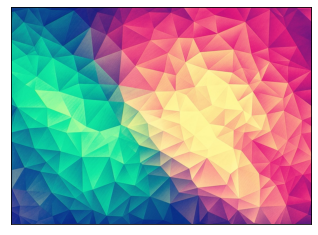

In [5]:
img = cv2.imread('data/fig1.jpg')

# 將 BGR 圖片轉為 RGB 圖片
# img = img[:,:,::-1] 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.xticks([]), plt.yticks([])
# plt.show() # jupyter界面不用

(([], []), ([], []))

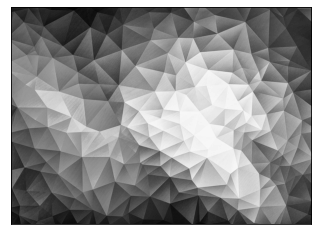

In [6]:
img = cv2.imread('data/fig1.jpg', cv2.IMREAD_GRAYSCALE)

# 單色指定cmap
plt.imshow(img, cmap='gray')
plt.xticks([]), plt.yticks([])
# plt.show() # jupyter界面不用

# Power-Law Transformations 調整亮度(Gamma曲線)

In [7]:
# 自刻 可丟入一維
def gamma_correction(img, g=2.2):
    out = img.copy()
    out = out.astype(np.float64)
    out /= 255.
    out = out**(1/g)

    out *= 255
    out = out.astype(np.uint8)

    return out

# 速度快很多 但是使用OpenCV lib 一定要輸入2dmin 影像
def gamma_correction2(img, gamma=2.2):
    lookUpTable = (pow(np.arange(256) / 255, gamma) * 255).astype(np.uint8).reshape((1, 256))
    res = cv2.LUT(img, lookUpTable)

    return res

(0.0, 255.0)

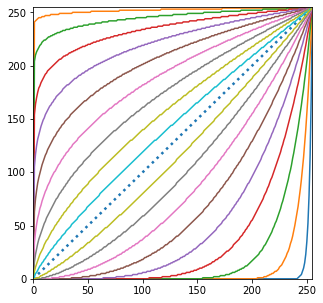

In [8]:
x = np.linspace(0, 255, 256)
plt.figure(figsize=(5, 5))
plt.plot(x, x, ':', linewidth=2.5)
# lst creat
neg_lst = np.power(np.linspace(0.1, 1, 9, endpoint=False), 2)
pos_lst = np.power(np.linspace(0.1, 1, 9, endpoint=False), -2)
for g in np.concatenate([pos_lst, neg_lst]):
    plt.plot(x, gamma_correction(x, g), linewidth=1.5)
    
plt.xlim(0, 255)
plt.ylim(0, 255)

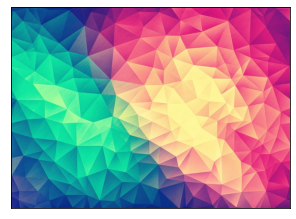

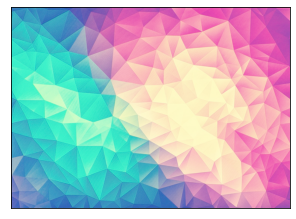

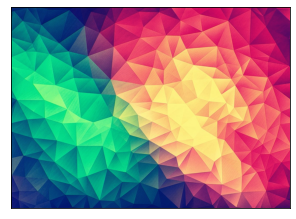

In [9]:
img = cv2.imread('data/fig1.jpg')
show_(img)
gamma = gamma_correction(img, 2)
show_(gamma)
gamma = gamma_correction(img, 0.75)
show_(gamma)

### [`Drawing Functions`](https://docs.opencv.org/4.2.0/d6/d6e/group__imgproc__draw.html) 

* `cv2.line(img, pt1, pt2, color, thickness)`
* `cv2.rectangle(img, pt1, pt2, color, thickness)`
* `cv2.circle(img, center, radius, color, thickness)`
* `cv2.ellipse(img, *args)`
* `cv2.polylines(img, pts, isClosed, color, thickness)`
    * 可以選擇不封閉 (可以一次話多條線段)
* `cv2.putText(img, *args)` 文字
* `*args:`
    * `color` 顏色
    * `thickness` 粗細 -1為封閉填滿
    * `linestyle`

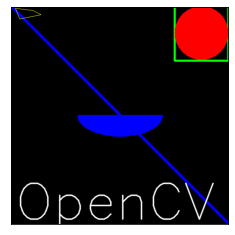

In [10]:
# Create a black image
img = np.zeros((512, 512, 3), np.uint8)

cv2.line(img, (0, 0), (511, 511), (255, 0, 0), 5)
cv2.rectangle(img, (384, 0), (510, 128), (0, 255, 0), 3)
cv2.circle(img, (447, 63), 63, (0, 0, 255), -1)
cv2.ellipse(img, (256, 256), (100, 50), 0, 0, 180, 255, -1)
pts = np.array([[10, 5], [20, 30], [70, 20], [50, 10]], np.int32).reshape((-1, 1, 2))
cv2.polylines(img, [pts], True, (0, 255, 255))

font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(img, 'OpenCV', (10, 500), font, 4, (255, 255, 255), 2, cv2.LINE_AA)

show_(img, 4)

### [`cv.setMouseCallback(window_name, MouseCallback(func))`](https://docs.opencv.org/4.2.0/d7/dfc/group__highgui.html#ga89e7806b0a616f6f1d502bd8c183ad3e) Window 的滑鼠控制

### [`MouseCallback`](https://docs.opencv.org/4.2.0/d7/dfc/group__highgui.html#gab7aed186e151d5222ef97192912127a4) Obj (func)
* `func(event, x, y, flags, param)`
    * event 滑鼠響應
    * x, y 滑鼠位置

In [11]:
for m in [i for i in dir(cv2) if 'EVENT' in i]:
    print(m)

EVENT_FLAG_ALTKEY
EVENT_FLAG_CTRLKEY
EVENT_FLAG_LBUTTON
EVENT_FLAG_MBUTTON
EVENT_FLAG_RBUTTON
EVENT_FLAG_SHIFTKEY
EVENT_LBUTTONDBLCLK
EVENT_LBUTTONDOWN
EVENT_LBUTTONUP
EVENT_MBUTTONDBLCLK
EVENT_MBUTTONDOWN
EVENT_MBUTTONUP
EVENT_MOUSEHWHEEL
EVENT_MOUSEMOVE
EVENT_MOUSEWHEEL
EVENT_RBUTTONDBLCLK
EVENT_RBUTTONDOWN
EVENT_RBUTTONUP


In [12]:
# mouse callback function
def draw_circle(event, x, y, flags, param):
    if event == cv2.EVENT_FLAG_LBUTTON: # 左鍵單擊
        cv2.circle(img, (x, y), 40, (255, 100, 100), -1)


# Create a black image, a window and bind the function to window
img = np.zeros((512, 512, 3), np.uint8)
cv2.namedWindow('image')
cv2.setMouseCallback('image', draw_circle)
while(1):
    cv2.imshow('image', img)
    if cv2.waitKey(20) & 0xFF == 27:
        break
cv2.destroyAllWindows()


### [`cv2.createTrackbar(trackbarname, window_name, default_value, max, func)`](https://docs.opencv.org/4.2.0/d7/dfc/group__highgui.html#gaf78d2155d30b728fc413803745b67a9b) # 創造調整條
* `default_value` : 初始值
* `max` : 最大值 最小為0
* `func` :　移動觸發的函數

### [`cv2.getTrackbarPos(trackbarname, window_name)`](https://docs.opencv.org/4.2.0/d7/dfc/group__highgui.html#ga122632e9e91b9ec06943472c55d9cda8) # 調整條取值

In [13]:
from time import sleep as slp

def nothing(x):
    pass


# Create a black image, a window
img = np.zeros((400, 400, 3), np.uint8)
cv2.namedWindow('image') # create window

# create trackbars for color change
cv2.createTrackbar('R', 'image', 0, 8, nothing)
cv2.createTrackbar('G', 'image', 0, 8, nothing)
cv2.createTrackbar('B', 'image', 0, 8, nothing)

# create switch for ON/OFF functionality
switch = 'OFF - ON'
cv2.createTrackbar('OFF - ON', 'image', 0, 1, nothing)

while True:
    slp(0.02)
    cv2.imshow('image', img)
    k = cv2.waitKey(1) & 0xFF
    if k == 27:
        break
        
    # get current positions of four trackbars
    r = cv2.getTrackbarPos('R', 'image')
    g = cv2.getTrackbarPos('G', 'image')
    b = cv2.getTrackbarPos('B', 'image')
    s = cv2.getTrackbarPos(switch, 'image')
    if s == 0:
        img[:] = 0
    else: # 閃爍燈
        img[:] = img[:] + np.array([b, g, r])
cv2.destroyAllWindows()


### [cv2.copyMakeBorder(img, top, bottom, left, right, borderType)](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#ga2ac1049c2c3dd25c2b41bffe17658a36)

####  Making Borders for Images (Padding)
* [BorderTypes](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#ga209f2f4869e304c82d07739337eae7c5)
    * `cv2.BORDER_CONSTANT` - Adds a constant colored border. The value should be given as next argument.
    * `cv2.BORDER_REFLECT` - Border will be mirror reflection of the border elements, like this : `fedcba|abcdefgh|hgfedcb`
    * `cv2.BORDER_REFLECT_101` - or cv.BORDER_DEFAULT - Same as above, but with a slight change, like this : `gfedcb|abcdefgh|gfedcba`
    * `cv2.BORDER_REPLICATE` - Last element is replicated throughout, like this: `aaaaaa|abcdefgh|hhhhhhh`
    * `cv2.BORDER_WRAP` - Can't explain, it will look like this : `cdefgh|abcdefgh|abcdefg`

(<AxesSubplot:title={'center':'CONSTANT'}>,
 Text(0.5, 1.0, 'CONSTANT'),
 ([], []),
 ([], []))

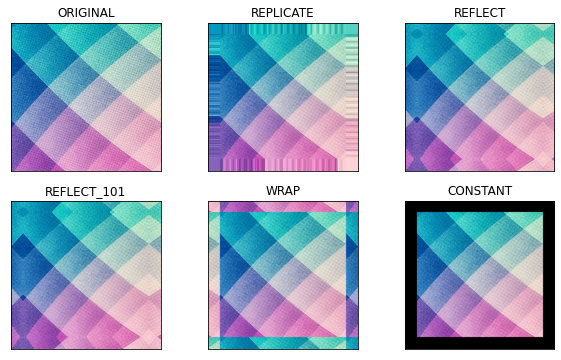

In [14]:
img = cv2.imread('data/p4.png')[:, :, ::-1]
replicate = cv2.copyMakeBorder(img, 40, 40, 40, 40, cv2.BORDER_REPLICATE)
reflect = cv2.copyMakeBorder(img, 40, 40, 40, 40, cv2.BORDER_REFLECT)
reflect101 = cv2.copyMakeBorder(img, 40, 40, 40, 40, cv2.BORDER_REFLECT_101)
wrap = cv2.copyMakeBorder(img, 40, 40, 40, 40, cv2.BORDER_WRAP)
constant = cv2.copyMakeBorder(img, 40, 40, 40, 40, cv2.BORDER_CONSTANT, value=[0, 0, 0])

plt.figure(figsize=(10, 6))
plt.subplot(231), plt.imshow(img, 'gray'), plt.title('ORIGINAL'), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(replicate, 'gray'), plt.title('REPLICATE'), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(reflect, 'gray'), plt.title('REFLECT'), plt.xticks([]), plt.yticks([])
plt.subplot(234), plt.imshow(reflect101, 'gray'), plt.title('REFLECT_101'), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(wrap, 'gray'), plt.title('WRAP'), plt.xticks([]), plt.yticks([])
plt.subplot(236), plt.imshow(constant, 'gray'), plt.title('CONSTANT'), plt.xticks([]), plt.yticks([])

### [`cv2.add(img1, img2)`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#ga10ac1bfb180e2cfda1701d06c24fdbd6)
* 超過255不會溢位 -> `np.minimun(arr, 255)`

### [`cv2.addWeighted(img1, 𝛼, img2, 𝛽, 𝛾)`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#gafafb2513349db3bcff51f54ee5592a19) 圖片疊加 (權重)

* $dst = \alpha \cdot img1 + \beta \cdot img2 + \gamma$

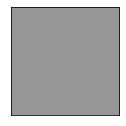

In [15]:
img1 = 50 * np.ones((300, 300, 3), np.uint8)
img2 = 100 * np.ones_like(img1,  np.uint8)
img = cv2.add(img1, img2)
show_(img, 2)

85


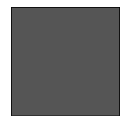

In [16]:
img = cv2.addWeighted(img1, 0.8, img2, 0.4, 5) # 50*0.8 + 100*0.4 + 5 = 85
print(img[0, 0, 0])
show_(img, 2)

### [`cv2.resize(img, (w, h), fx, fy, interpolation)`](https://docs.opencv.org/4.2.0/da/d54/group__imgproc__transform.html#ga47a974309e9102f5f08231edc7e7529d)
* `cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)`
* `cv2.resize(img, (width, height), interpolation=cv2.INTER_CUBIC)`
* [`interpolation`](https://docs.opencv.org/4.2.0/da/d54/group__imgproc__transform.html#gga5bb5a1fea74ea38e1a5445ca803ff121a55e404e7fa9684af79fe9827f36a5dc1) 縮放的演算法選擇
    * 放大推薦使用 `cv2.INTER_CUBIC`(慢), `cv2.INTER_LINEAR`(預設)
    * 縮小推薦使用 `cv2.INTER_AREA`

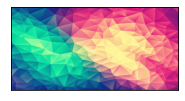

(920, 1272, 3)
(250, 500, 3)


In [17]:
img = cv2.imread('data/fig1.jpg')
img2 = cv2.resize(img, (500, 250), interpolation=cv2.INTER_CUBIC)
show_(img2, 3)
print(img.shape)
print(img2.shape)

### [`cv2.warpAffine(img, M, (width, height))`](https://docs.opencv.org/4.2.0/da/d54/group__imgproc__transform.html#ga0203d9ee5fcd28d40dbc4a1ea4451983)  線性轉換
* M 來決定不同的方式

#### 平移
* $M = \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \end{bmatrix}$

#### 旋轉
* [__`cv2.getRotationMatrix2D(center, angle, scale)`__](https://docs.opencv.org/4.2.0/da/d54/group__imgproc__transform.html#gafbbc470ce83812914a70abfb604f4326) 生成旋轉矩陣

* 公式
    * $M = \begin{bmatrix} cos\theta & -sin\theta \\ sin\theta & cos\theta \end{bmatrix}$
    
* OpenCV 可自訂旋轉中心點：
    * $\begin{bmatrix} \alpha & \beta & (1- \alpha ) \cdot center.x - \beta \cdot center.y \\ - \beta & \alpha & \beta \cdot center.x + (1- \alpha ) \cdot center.y \end{bmatrix}$
    * $\begin{array}{l} \alpha = scale \cdot \cos \theta , \\ \beta = scale \cdot \sin \theta \end{array}$
* `scale`(float) 執行縮放

#### Affine Transformation
* [__`cv2.getAffineTransform(pts1, pts2)`__](https://docs.opencv.org/4.2.0/da/d54/group__imgproc__transform.html#ga47069038267385913c61334e3d6af2e0) 來產生這個矩陣
* $M = \begin{bmatrix} n & m & x \\ a & b & y \end{bmatrix}$ 用三個點的線性變換來決定矩陣
![](https://docs.opencv.org/4.2.0/affine.jpg)

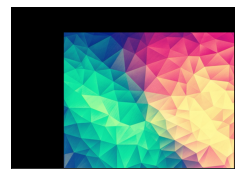

In [18]:
M = np.float32([[1, 0, 300], [0, 1, 150]]) # np.float32
h, w = img.shape[0:2]
img3 = cv2.warpAffine(img, M, (w, h))
show_(img3, 4)

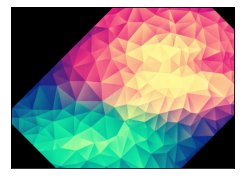

In [19]:
M = cv2.getRotationMatrix2D((w/2 +100, h/2-100), 45, 1)
img3 = cv2.warpAffine(img, M, (w, h))
show_(img3, 4)

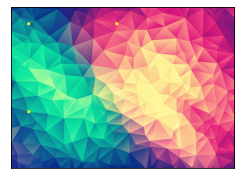

In [20]:
# Affine Transformation
img = cv2.imread('data/fig1.jpg')

pts1 = np.float32([[100, 100], [100, 600], [600, 100]])
pts2 = np.float32([[200, 200], [300, 800], [900, 300]])
M = cv2.getAffineTransform(pts1, pts2)
s = 7
for arr in pts1:
    i, j = np.int64(arr)
    img[i-s:i+s+1, j-s:j+s+1] = [0, 255, 255]
show_(img, 4)

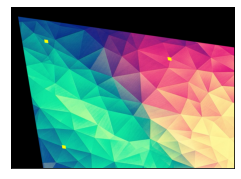

In [21]:
img4 = cv2.warpAffine(img, M, (w, h))
show_(img4, 4)

### [`cv2.warpPerspective(img, M, (width, height))`](https://docs.opencv.org/4.2.0/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87)
* [`cv2.getPerspectiveTransform(pts1, pts2)`](https://docs.opencv.org/4.2.0/da/d54/group__imgproc__transform.html#gae66ba39ba2e47dd0750555c7e986ab85) 生成矩陣
* Perspective Transformation 透視變換

![](https://docs.opencv.org/4.2.0/perspective.jpg)

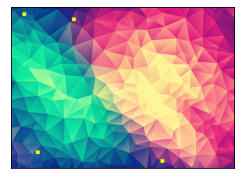

In [22]:
# Perspective Transformation
img = cv2.imread('data/fig1.jpg')
pts1 = np.float32([[46, 75], [830, 152], [75, 357], [880, 859]])
pts2 = np.float32([[0, 0], [600, 0], [0, 600], [600, 600]])
M = cv2.getPerspectiveTransform(pts1, pts2)

s = 10
for arr in pts1:
    i, j = np.int64(arr)
    img[i-s:i+s+1, j-s:j+s+1] = [0, 255, 255]
show_(img, 4)

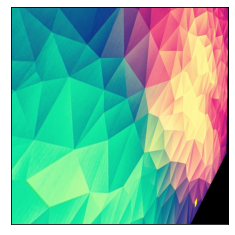

In [23]:
img5 = cv2.warpPerspective(img, M, (700, 700))
show_(img5, 4)

## [閥值](https://docs.opencv.org/4.2.0/d7/d4d/tutorial_py_thresholding.html)
### [`cv2.threshold(img, thresh, maxval, type )`](https://docs.opencv.org/4.2.0/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) 簡單閥值
* `thresh` 基準值
* `macxval` 最大值(cv2.THRESH_BINARY, cv2.THRESH_BINARY_INV 專用)
* `output` : retval, dst

#### [`Threshold Types`](https://docs.opencv.org/4.2.0/d7/d1b/group__imgproc__misc.html#gaa9e58d2860d4afa658ef70a9b1115576)

![](https://docs.opencv.org/4.2.0/threshold.png)

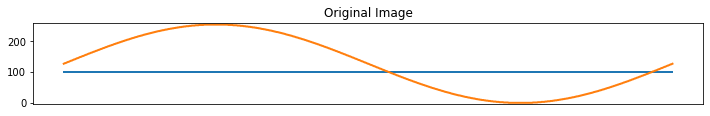

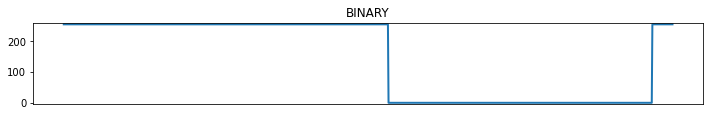

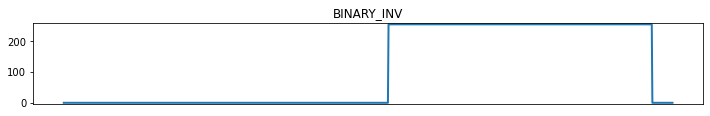

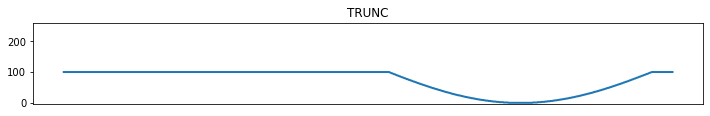

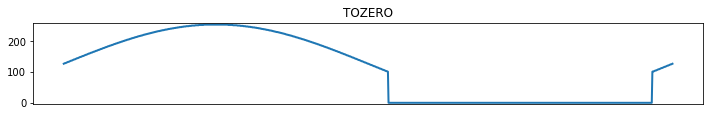

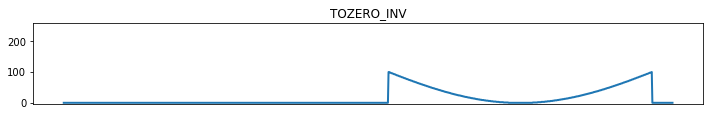

In [24]:
x = np.linspace(0, 2 * np.pi, 1000)
img = np.uint8(((np.sin(x) + 1) / 2) * 255)
thresh = 100
maxval = 255
    
ret, thresh1 = cv2.threshold(img, thresh, maxval, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(img, thresh, maxval, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(img, thresh, -1, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(img, thresh, -1, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(img, thresh, -1, cv2.THRESH_TOZERO_INV)
titles = ['Original Image', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
for i in range(6):
    plt.figure(figsize=(12, 1.5))
    if i == 0:
        plt.plot(thresh * np.ones(1000), lw=2)
    plt.plot(images[i], lw=2)
    plt.title(titles[i])
    plt.ylim(-5, 260)
    plt.xticks([])
    plt.show()

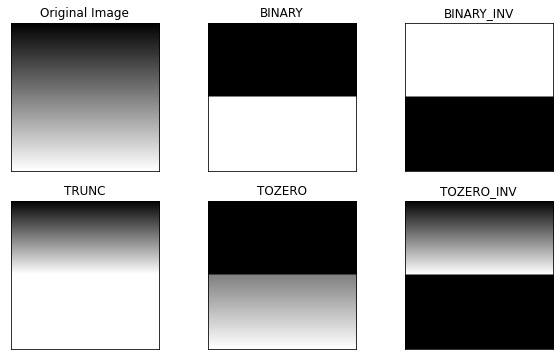

In [25]:
img = np.uint8(np.zeros((256, 256)))
for i in range(256):
    img[i, :] = i

thresh = 127
maxval = 255
    
ret, thresh1 = cv2.threshold(img, thresh, maxval, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(img, thresh, maxval, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(img, thresh, maxval, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(img, thresh, maxval, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(img, thresh, maxval, cv2.THRESH_TOZERO_INV)
titles = ['Original Image', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize=(10, 6))
for i in range(6):
    plt.subplot(2, 3, i + 1), plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

### [`cv2.adaptiveThreshold(img, maxValue, adaptiveMethod, thresholdType, blockSize, C)`](https://docs.opencv.org/4.2.0/d7/d1b/group__imgproc__misc.html#ga72b913f352e4a1b1b397736707afcde3) 自動閥值
* maxValue 最大值
* [`adaptiveMethod`](https://docs.opencv.org/4.2.0/d7/d1b/group__imgproc__misc.html#gaa42a3e6ef26247da787bf34030ed772c)
    * `cv2.ADAPTIVE_THRESH_MEAN_C` 閥值取決filter平均值
    * `cv2.ADPTIVE_THRESH_GAUSSIAN_C` 閥值取決filter 的高斯window
* thresholdType (THRESH_BINARY, THRESH_BINARY_INV 二選一)
* blockSize 運算方塊大小(解析度) 一定要是奇數
* C 運算的常數
* 
![](https://docs.opencv.org/4.2.0/ada_threshold.jpg)

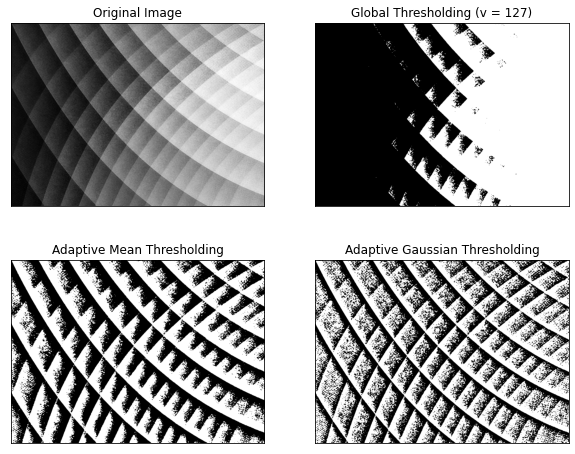

In [26]:
img = cv2.imread('data/fig2.jpg', 0)
img = cv2.medianBlur(img, 5)
ret, th1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 99, 2)
th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 99, 2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
          'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
plt.figure(figsize=(10, 8))
for i in range(4):
    plt.subplot(2, 2, i + 1), plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

### [`cv2.GaussianBlur(img, ksize, sigmaX,)`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1) # Gaussian filter 高斯濾鏡
* ksize (n, m) tuple, m, n 都要奇數

### `cv.THRESH_OTSU` Otsu's 二值化
* 在雙峰的圖形中, 找谷底當作閥值

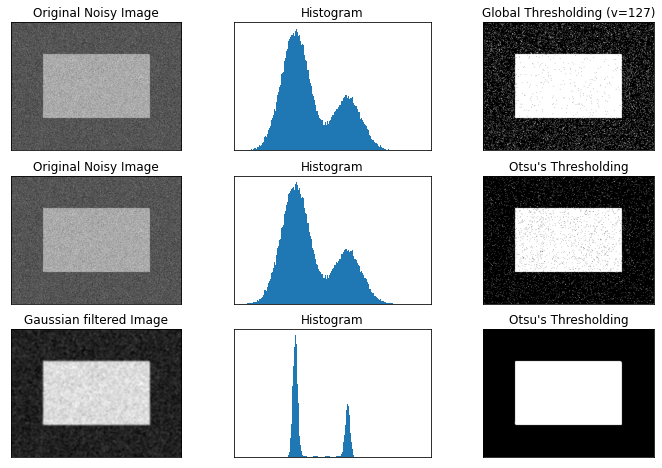

In [27]:
img = np.maximum(np.random.normal(75, 20, (300, 400)), 0)
img[75:225, 75:325] = np.minimum(np.random.normal(150, 20, (150, 250)), 255)
img = np.uint8(img)


# global thresholding
ret1, th1 = cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)

# Otsu's thresholding # thresh 設定為0, cv2.THRESH_OTSU 會自動找到最佳值
ret2, th2 = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Otsu's thresholding after Gaussian filtering  # thresh 設定為0, cv2.THRESH_OTSU 會自動找到最佳值
blur = cv2.GaussianBlur(img, (9, 9), 0)
ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# plot all the images and their histograms
images = [img, 0, th1,
          img, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image', 'Histogram', 'Global Thresholding (v=127)',
          'Original Noisy Image', 'Histogram', "Otsu's Thresholding",
          'Gaussian filtered Image', 'Histogram', "Otsu's Thresholding"]

plt.figure(figsize=(12, 8))
for i in range(3):
    plt.subplot(3, 3, i * 3 + 1), plt.imshow(images[i * 3], 'gray')
    plt.title(titles[i * 3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3, 3, i * 3 + 2), plt.hist(images[i * 3].ravel(), 256, [0, 256])
    plt.title(titles[i * 3 + 1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3, 3, i * 3 + 3), plt.imshow(images[i * 3 + 2], 'gray')
    plt.title(titles[i * 3 + 2]), plt.xticks([]), plt.yticks([])


### [`cv2.bitwise`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#ga60b4d04b251ba5eb1392c34425497e14) # 二進位邏輯運算
* `_and(arr1, arr2, mask)` == arr1 & arr2 if mask > 1
* `_not(arr1, mask)` == ~arr if mask > 1
* `_or(arr1, arr2, mask)` == arr1 | arr2 if mask > 1
* `_xor(arr1, arr2, mask)` == arr1 ^ arr2 if mask > 1
    

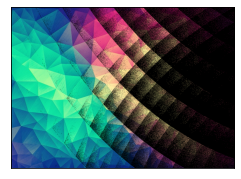

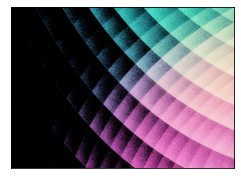

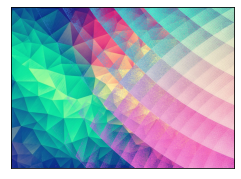

In [28]:
# Load two images
img1 = cv2.imread('data/fig1.jpg')
img2 = cv2.imread('data/fig2.jpg')

# Now create a mask of logo and create its inverse mask also
img2gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
ret, mask = cv2.threshold(img2gray, 128, 256, cv2.THRESH_BINARY)
mask_inv = cv2.bitwise_not(mask)

# Now black-out the area of logo in ROI
img1_bg = cv2.bitwise_and(img1, img1, mask=mask_inv) # 速度比較快
# img1_bg = (img1.transpose(2, 0, 1) * mask_inv).transpose(1, 2, 0)

# Take only region of logo from logo image.
img2_fg = cv2.bitwise_and(img2, img2, mask=mask)
# img2_bg = (img2.transpose(2, 0, 1) * mask).transpose(1, 2, 0)


# Put logo in ROI and modify the main image
img = cv2.add(img1_bg, img2_fg)

#show
show_(img1_bg, 4)
show_(img2_fg, 4)
show_(img, 4)

## Image Filtering # 圖片濾鏡
* 一個模糊濾鏡(3 x 3): 
> $K = \frac{1}{9} \begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\ 1 & 1 & 1 \end{bmatrix}$
* 影像積分的概念

### [`cv2.filter2D(img, ddepth, kernel, outimg)`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04)
* `ddepth` (when ddepth=-1, the output image will have the same depth as the source.) 設定-1 會和img預設一樣
* `kernel` (2D np.array) 濾鏡自己寫
* 捲積依照資料格式不會超過限制數值 uint8(0~255) 

(([], []), ([], []))

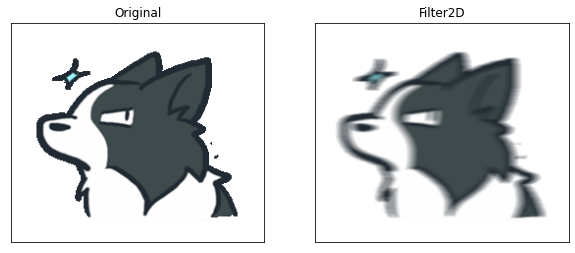

In [29]:
img = cv2.imread('data/p1.png') - 1
kernel = np.ones((2, 12)) / 24 # 不設定正方形 有單邊模糊的感覺(速度感)
dst = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=(10, 6))
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(dst), plt.title('Filter2D')
plt.xticks([]), plt.yticks([])

### [`cv2.blur(img, ksize(m, n))`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#ga8c45db9afe636703801b0b2e440fce37) # 模糊濾鏡 Averaging

(([], []), ([], []))

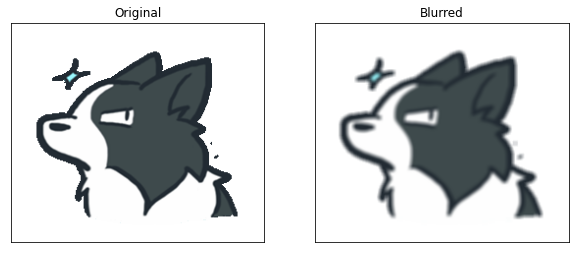

In [30]:
blur = cv2.blur(img, (5, 5))

plt.figure(figsize=(10, 6))
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur), plt.title('Blurred')
plt.xticks([]), plt.yticks([])

### [`cv2.GaussianBlur(img, ksize (m, n), sigmaX, sigmaY=0)`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1) # 高斯濾鏡 Gaussian Blurring
* m, n 為奇數
* [__`cv2.getGaussianKernel(ksize (int), sigma)`__](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gac05a120c1ae92a6060dd0db190a61afa) 可以生成高斯濾鏡
    * ksize 大小不影響分佈寬度 (高斯分佈的寬度由 sigma 控制)
    * sigma : 負數自動設定sigma = 0.3 x ((ksize - 1) x 0.5 - 1) + 0.8.
    * 標準sigma : 1

(([], []), ([], []))

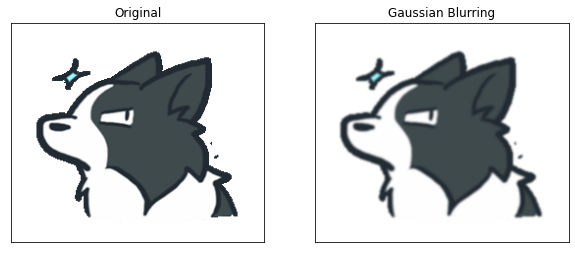

In [31]:
blur = cv2.GaussianBlur(img, (5, 5), 1)

plt.figure(figsize=(10, 6))
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur), plt.title('Gaussian Blurring')
plt.xticks([]), plt.yticks([])

#### 固定sigma

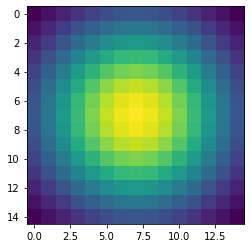

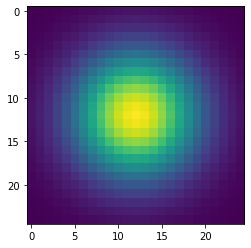

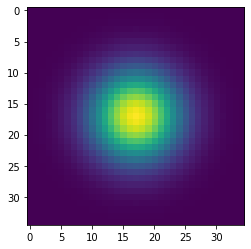

In [32]:
for i in [15, 25, 35]:
    kernel = cv2.getGaussianKernel(i, 5) # 生成高斯濾鏡
    kernel = kernel * kernel.T
    plt.imshow(kernel)
    plt.show()

#### 標準分布 sigma=0 約6sigma 為寬度

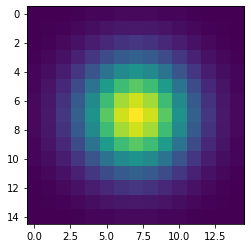

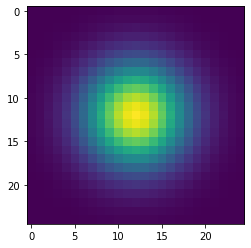

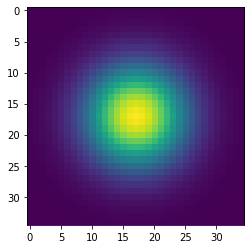

In [33]:
for i in [15, 25, 35]:
    kernel = cv2.getGaussianKernel(i, 0) # 生成高斯濾鏡
    kernel = kernel * kernel.T
    plt.imshow(kernel)
    plt.show()

(([], []), ([], []))

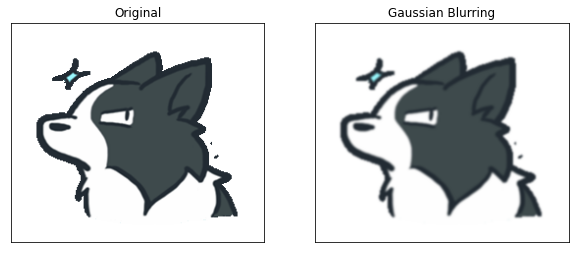

In [34]:
kernel = cv2.getGaussianKernel(5, 1) # 生成高斯濾鏡
kernel = kernel * kernel.T # 轉換成 5x5
dst = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=(10, 6))
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(dst), plt.title('Gaussian Blurring')
plt.xticks([]), plt.yticks([])

### [`cv2.medianBlur(img, ksize (int))`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#ga564869aa33e58769b4469101aac458f9) # 中值濾鏡 Median Blurring
* ksize 為奇數
* __輸出mask中像素的中位數__
* 排序統計濾鏡
    * `max` 最大值 (形態學, 膨脹)
    * `min` 最小值 (形態學, 腐蝕)
    * `median` 中位數 __(適合處理脈衝雜訊)__

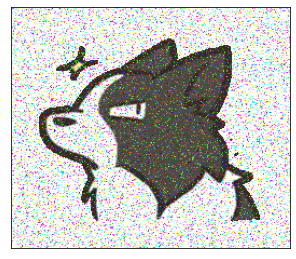

In [35]:
img = cv2.imread('data/p1.png') - 1

# 增加noise
noise_filter = np.random.uniform(0 , 1, size=(img.shape)) < 0.15
noise = np.uint8(np.random.uniform(0, 255, size=(img.shape)))
img[noise_filter] = noise[noise_filter]

show_(img, 5)

(([], []), ([], []))

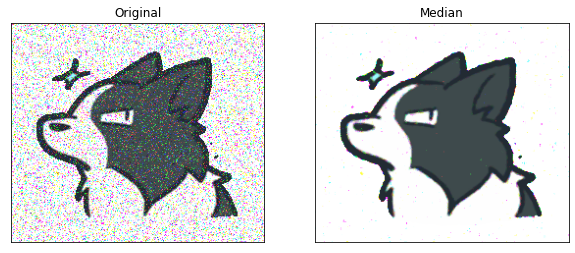

In [36]:
median = cv2.medianBlur(img, 3)

plt.figure(figsize=(10, 6))
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(median), plt.title('Median')
plt.xticks([]), plt.yticks([])

### [`cv.bilateralFilter(img, d, sigmaColor, sigmaSpace, borderType=BORDER_DEFAULT )`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#ga9d7064d478c95d60003cf839430737ed) # 雙邊過濾 Bilateral Filtering
* 同時考慮灰度值, 數值相近的像素才會拿來做模糊運算(非邊緣處)
* 模糊降噪點 同時保留邊緣
* 需要大量運算比較慢

![](https://docs.opencv.org/4.2.0/bilateral.jpg)

(([], []), ([], []))

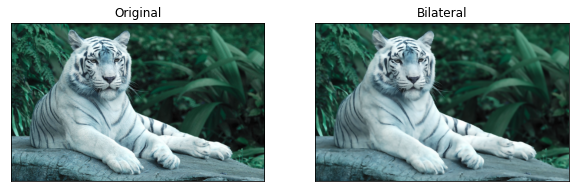

In [37]:
img = cv2.imread('data/tiger.jpg')
blur = cv2.bilateralFilter(img, 15, 75, 75)

plt.figure(figsize=(10, 6))
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur), plt.title('Bilateral')
plt.xticks([]), plt.yticks([])

# [形態學 Morphological Transformations](https://docs.opencv.org/4.2.0/d9/d61/tutorial_py_morphological_ops.html)

### [`cv2.erode(img, kernel, iterations(int))`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gaeb1e0c1033e3f6b891a25d0511362aeb) 腐蝕
* `iterations`: 迭代次數
* 新值是乘以 kernel 之後最小值
    * $\texttt{dst} (x,y) = \min _{(x',y'): \, \texttt{element} (x',y') \ne0 } src (x+x',y+y')$

### [`cv2.dilate(img, kernel, iterations(int))`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#ga4ff0f3318642c4f469d0e11f242f3b6c) 膨脹
* `iterations`: 迭代次數
* 新值是乘以 kernel 之後最大值
    * $\texttt{dst} (x,y) = \max _{(x',y'): \, \texttt{element} (x',y') \ne0 } src (x+x',y+y')$

### [`cv2.morphologyEx(img, op, kernel, iterations(int))`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#ga67493776e3ad1a3df63883829375201f)
* `iterations`: 迭代次數
* [`op_type`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#ga7be549266bad7b2e6a04db49827f9f32)
    * `cv2.MORPH_OPEN` 先腐蝕再膨脹
    * `cv2.MORPH_CLOSE` 先膨脹再腐蝕
    * `cv2.MORPH_GRADIENT` 膨脹和腐蝕差異

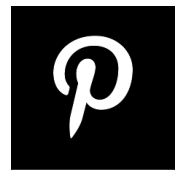

In [38]:
img = cv2.imread('data/p.png', 0)
img = cv2.bitwise_not(img)
show_(img, 3)

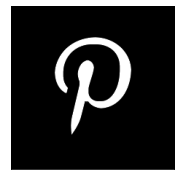

In [39]:
kernel = np.ones((5, 5), np.uint8)
erosion = cv2.erode(img, kernel, iterations=1)
show_(erosion, 3)

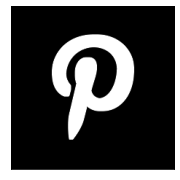

In [40]:
dilation = cv2.dilate(img, kernel, iterations=1)
show_(dilation, 3)

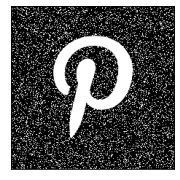

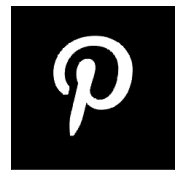

In [41]:
# 把雜訊吃掉, 吃掉白雜訊
noise = np.uint8((np.random.uniform(size=img.shape) > 0.85 ) * 255)
img_ = cv2.add(img, noise)

opening = cv2.morphologyEx(img_, cv2.MORPH_OPEN, kernel)

# res = cv2.erode(img_, kernel, iterations=1)
# res = cv2.dilate(res, kernel, iterations=1)

show_(img_, 3)
show_(opening, 3)
# show_(res, 3)

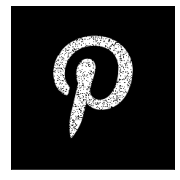

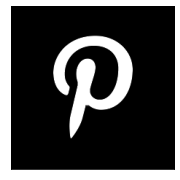

In [42]:
# 把雜訊吃掉, 吃掉黑雜訊
noise = np.uint8((np.random.uniform(size=img.shape) > 0.15 ) * 255)
img_ = cv2.bitwise_and(img, noise, mask=img)

closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)

# res = cv2.dilate(img_, kernel, iterations=1)
# res = cv2.erode(res, kernel, iterations=1)

show_(img_, 3)
show_(closing, 3)
# show_(res, 3)

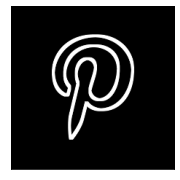

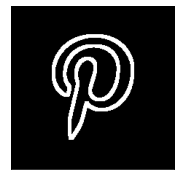

In [43]:
gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

show_(gradient, 3)
show_((erosion != dilation) * 255, 3)

### 利用[`cv2.getStructuringElement(Morph-shape, ksize (tuple))`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gac342a1bb6eabf6f55c803b09268e36dc) # 生成結構 kernel
> $K = \begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\ 1 & 1 & 1 \end{bmatrix}$
* shape: [`MorphShapes`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gac2db39b56866583a95a5680313c314ad) (0~2)
* All 1, 認定 0 or 1
* 多於 1個 1, 認定 0 or 1
* 同樣可以消除noise
* 輪廓, 以上兩種的相反型態
* `cv2.MORPH_ELLIPSE` 是橢圓形 要圓形可以用兩個橢圓疊起來XD

In [44]:
arr = cv2.getStructuringElement(cv2.MORPH_RECT, (11, 11))
print(arr)

[[1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]]


In [45]:
arr = cv2.getStructuringElement(cv2.MORPH_CROSS, (11, 11))
print(arr)

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


In [46]:
arr = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
print(arr)

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


In [47]:
k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
print(k & k.T)

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


In [48]:
k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
print(k | k.T)

[[0 0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]]


# [Image Gradients 影像微分](https://docs.opencv.org/4.2.0/d5/d0f/tutorial_py_gradients.html)
* 也是濾鏡的一種 但是總和為0, 並且完成後 + 原圖片 
* 增加清晰度
* 抓取圖像邊緣
* [__`Sobel & Scharr`__](https://zh.wikipedia.org/wiki/%E7%B4%A2%E8%B2%9D%E7%88%BE%E7%AE%97%E5%AD%90)

### [`cv2.Sobel(img, ddepth, dx, dy, ksize (int))`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gacea54f142e81b6758cb6f375ce782c8d) Gausssian smoothing plus differentiation operation
* ksize 為奇數, 設定-1, 為預設的3
* dx, dy (0 or 1)
    * $Gx = \begin{bmatrix} +1 & 0 & -1 \\ +2 & 0 & -2 \\ +1 & 0 & -1 \end{bmatrix}$
    * $Gy = \begin{bmatrix} +1 & +2 & +1 \\ 0 & 0 & 0 \\ -1 & -2 & -1 \end{bmatrix}$

### [`cv2.Scharr(img, ddepth, dx, dy)`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gaa13106761eedf14798f37aa2d60404c9)
* dx, dy (0 or 1)
    * $Gx = \begin{bmatrix} +3 & 0 & -3 \\ +10 & 0 & -10 \\ +3 & 0 & -3 \end{bmatrix}$
    * $Gy = \begin{bmatrix} +3 & +10 & +3 \\ 0 & 0 & 0 \\ -3 & -10 & -3 \end{bmatrix}$
    
### [`  cv2.Laplacian(img, ddepth, ksize (int))`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gad78703e4c8fe703d479c1860d76429e6) 二階導數
* ksize>1, When ksize=1 set (3x3)
    * Laplacian Derivatives:  $kernel = \begin{bmatrix} 0 & 1 & 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0 \end{bmatrix}$

#### `ddepth` 
* set `-1` (和原始圖形相同)
* cv2.CV_64F (主要是微分導數有正負數 uint8無法接受負數字)

(Text(0.5, 1.0, 'Scharr Y'), ([], []), ([], []))

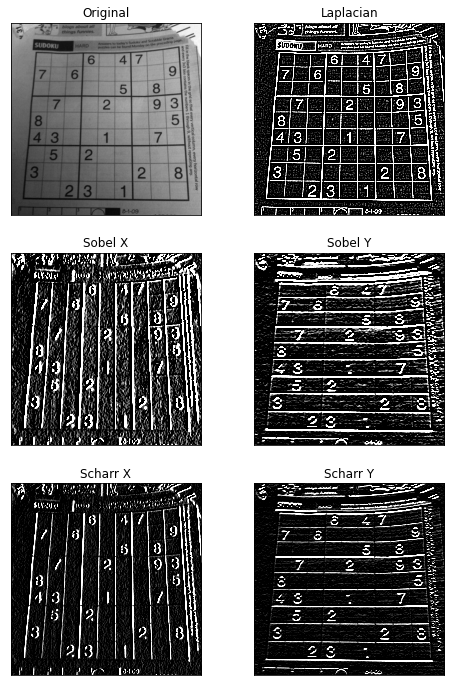

In [49]:
img = cv2.imread('data/dave.jpg',0)

laplacian = cv2.Laplacian(img, cv2.CV_64F, ksize=5)
sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
scharrx = cv2.Scharr(img, cv2.CV_64F, 1, 0)
scharry = cv2.Scharr(img, cv2.CV_64F, 0, 1)
plt.figure(figsize=(8, 12))
plt.subplot(3, 2, 1), plt.imshow(img, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(3, 2, 2), plt.imshow(laplacian, cmap='gray', vmin=0, vmax=255)
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(3, 2, 3), plt.imshow(sobelx, cmap='gray', vmin=0, vmax=255)
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(3, 2, 4), plt.imshow(sobely, cmap='gray', vmin=0, vmax=255)
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.subplot(3, 2, 5), plt.imshow(scharrx, cmap='gray', vmin=0, vmax=255)
plt.title('Scharr X'), plt.xticks([]), plt.yticks([])
plt.subplot(3, 2, 6), plt.imshow(scharry, cmap='gray', vmin=0, vmax=255)
plt.title('Scharr Y'), plt.xticks([]), plt.yticks([])

### ddepth 設定演示

(Text(0.5, 1.0, 'Sobel abs(CV_64F)'), ([], []), ([], []))

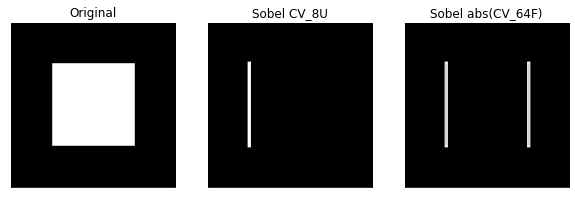

In [50]:
img = np.zeros((200, 200), np.uint8)
img[50:150, 50:150] = 255

# Output dtype = cv2.CV_8U
sobelx8u = cv2.Sobel(img, cv2.CV_8U, 1, 0, ksize=5)
# Output dtype = cv2.CV_64F. Then take its absolute and conv2ert to cv2.CV_8U
sobelx64f = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
abs_sobel64f = np.absolute(sobelx64f)
sobel_8u = np.uint8(abs_sobel64f)
plt.figure(figsize=(10, 6))
plt.subplot(1, 3, 1), plt.imshow(img, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 2), plt.imshow(sobelx8u, cmap='gray')
plt.title('Sobel CV_8U'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 3), plt.imshow(sobel_8u, cmap='gray')
plt.title('Sobel abs(CV_64F)'), plt.xticks([]), plt.yticks([])


## [Canny Edge Detection](https://docs.opencv.org/4.2.0/da/d22/tutorial_py_canny.html)
### [`cv2.Canny(img (8-bit), threshold1, threshold2)`](https://docs.opencv.org/4.2.0/dd/d1a/group__imgproc__feature.html#ga04723e007ed888ddf11d9ba04e2232de)  邊緣抓取
* [參考資料](https://docs.opencv.org/4.2.0/da/d22/tutorial_py_canny.html)
* [參考資料2](https://chtseng.wordpress.com/2016/12/05/opencv-more-on-edge-detection/)

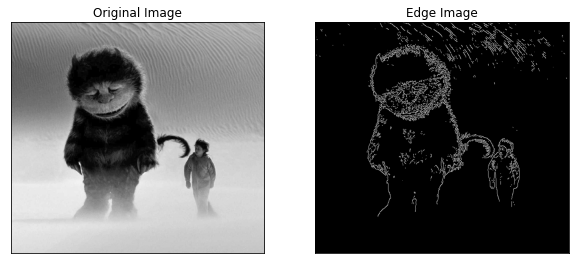

In [51]:
img = cv2.imread('data/wild.png', 0)
edges = cv2.Canny(img, 100, 120)

plt.figure(figsize=(10, 6))
plt.subplot(121), plt.imshow(img, cmap='gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(edges, cmap='gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()


## [Image Pyramids](https://docs.opencv.org/4.2.0/dc/dff/tutorial_py_pyramids.html)
* 高斯金字塔: 圖像取高斯濾鏡之後去掉偶數的像素
    * [降採樣](https://zh.wikipedia.org/wiki/%E9%99%8D%E9%87%87%E6%A0%B7)
* 拉普拉斯金字塔: 圖像縮小後在放大還原跟原本圖像的差別
* 原圖 -> 高斯縮小 -> 高斯放大 + 拉普拉斯金字塔 = 原圖 (圖像還原, 再接縫處會自己銜接)

### [`cv2.pyrDown(img, dstsize, borderType)`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gaf9bba239dfca11654cb7f50f889fc2ff)
* 圖片縮小2倍
* 使用5*5高斯濾鏡: $\frac{1}{256} \begin{bmatrix} 1 & 4 & 6 & 4 & 1 \\ 4 & 16 & 24 & 16 & 4 \\ 6 & 24 & 36 & 24 & 6 \\ 4 & 16 & 24 & 16 & 4 \\ 1 & 4 & 6 & 4 & 1 \end{bmatrix}$
* `*args:`
    * `dstsize` :輸出設定
    * `borderType` :邊界設定

### [`cv2.pyrUp(img, dstsize, borderType)`](https://docs.opencv.org/4.2.0/d4/d86/group__imgproc__filter.html#gada75b59bdaaca411ed6fee10085eb784)
* 圖片放大兩倍
* `*args:`
    * `dstsize` :輸出設定
    * `borderType` :邊界設定

shape: (256, 256)
min: 0
max: 252
mean: 182.8223876953125
std: 62.68371200514711
dtype: uint8



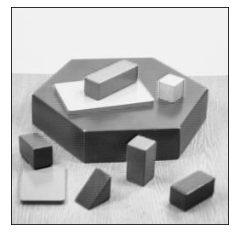

shape: (128, 128)
min: 28
max: 243
mean: 182.87127685546875
std: 61.710469936516084
dtype: uint8



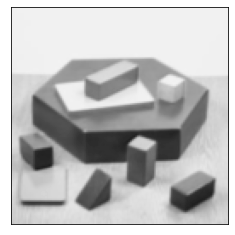

In [52]:
img = cv2.imread('data/corner.jpg', 0)
img_info(img)
show_(img, 4)

# 製作kernel
ar = np.array([[1, 4, 6, 4, 1]])
kernel = (ar * ar.T) / 256
img_ = cv2.filter2D(img, -1, kernel)
img_ = img_[::2, ::2]
img_info(img_)
show_(img_, 4)

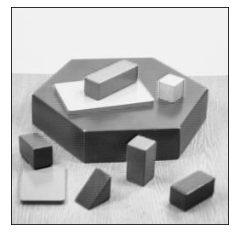

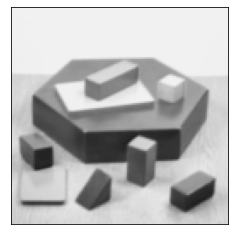

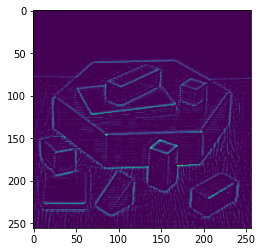

In [53]:
show_(img, 4)

# Gaussian Pyramid 
img_G1 = cv2.pyrDown(img)
show_(img_G1, 4)

# Laplacian Pyramids
img_L = cv2.subtract(img, cv2.pyrUp(img_G1))
plt.imshow(img_L)

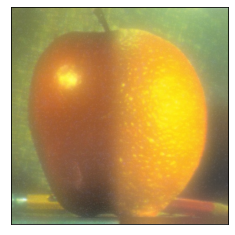

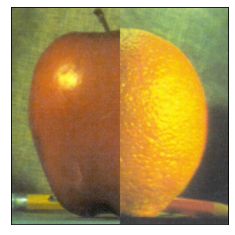

In [54]:
A = cv2.imread('data/apple.jpg')
B = cv2.imread('data/orange.jpg')

# generate Gaussian pyramid
G = A.copy()
gpA = [A.copy()]
gpB = [B.copy()]
for i in range(6):
    gpA.append(cv2.pyrDown(gpA[i]))
    gpB.append(cv2.pyrDown(gpB[i]))

# generate Laplacian Pyramid
lpA = [gpA[5]]
lpB = [gpB[5]]
for i in range(5, 0, -1):
    L = cv2.subtract(gpA[i - 1], cv2.pyrUp(gpA[i]))
    lpA.append(L)    
    L = cv2.subtract(gpB[i - 1], cv2.pyrUp(gpB[i]))
    lpB.append(L) 

# Now add left and right halves of images in each level
LS = []
for la, lb in zip(lpA, lpB):
    rows, cols, dpt = la.shape
    ls = np.hstack((la[:, 0:cols // 2], lb[:, cols // 2:]))
    LS.append(ls)

# now reconstruct
ls_ = LS[0]
for i in range(1, 6):
    ls_ = cv2.pyrUp(ls_)
    ls_ = cv2.add(ls_, LS[i])

# image with direct connecting each half
real = np.hstack((A[:, :cols // 2], B[:, cols // 2:]))

show_(ls_, 4)
show_(real, 4)

## [Contours 輪廓抓取](https://docs.opencv.org/4.2.0/d3/d05/tutorial_py_table_of_contents_contours.html)

### [`cv2.findContours(img (8-bit), mode, method)`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#gadf1ad6a0b82947fa1fe3c3d497f260e0)  尋找輪廓
* [`mode`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#ga819779b9857cc2f8601e6526a3a5bc71) 輪廓檢索模式 [解釋](https://docs.opencv.org/3.4/d9/d8b/tutorial_py_contours_hierarchy.html)
    * 見下方解釋
* [`method`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#ga4303f45752694956374734a03c54d5ff) 輪廓近似方法
    * `cv2.CHAIN_APPROX_NONE` 所有點位
    * `cv2.CHAIN_APPROX_SIMPLE` 線段只存兩端點
* `output` : contours, hierarchy
    * `contous(list)` 輪廓, 幾個輪廓就幾項 (白色部份), np.array 所有邊界的座標
    * `hierarchy` 輪廓層級
### [`cv2.drawContours(image, contours (list), contour_index, color (0-255), thickness=1)`](https://docs.opencv.org/4.2.0/d6/d6e/group__imgproc__draw.html#ga746c0625f1781f1ffc9056259103edbc)  畫出輪廓
* `contours` cv2.findContours's output
* `contour_index` 指定index (-1 畫出全部)
* 會修改img

## 輪廓層級
* 圖片的不同輪廓都有不同的層級
![](https://docs.opencv.org/4.2.0/hierarchy.png)
* 可以包圍即為對方的父輪廓, 被包住即為子輪廓(2 & 2a)
* 互相不能包住的為同級輪廓(0 & 1)
* 抓取輪廓同時會回傳輪廓層級, OpenCV 的層級表示 `[Next, Previous, First_Child, Parent]`
    * `Next` 同級的下一個輪廓, 最後一個同級輪廓顯示-1
    * `Previous` 同級前一個輪廓, 第一個同級輪廓顯示-1
    * `First_Child` 第一個子輪廓
    * `Parent` 父輪廓
    * 沒有父or子輪廓顯示-1
    
### 輪廓索引模式(mode)
* `cv2.RETR_LIST` 所有輪廓都為同等級不分父子
    * `[?, ?, -1, -1]`
* `cv2.RETR_EXTERNAL` 只回傳0級(最外層)忽略所有子輪廓
* `cv2.RETR_CCOMP` 限定只分級兩層結構
    * ![](https://docs.opencv.org/4.2.0/ccomp_hierarchy.png)
* `cv2.RETR_TREE` 完整的分層結構
    * ![](https://docs.opencv.org/4.2.0/tree_hierarchy.png)

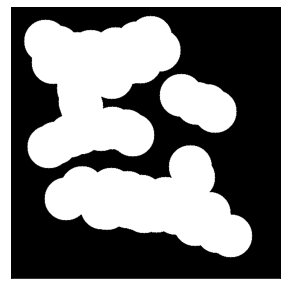

contours number: 3


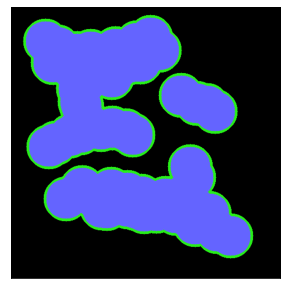

In [55]:
img = cv2.imread('data/p2.png')
img_ = np.copy(img)
ret, thresh = cv2.threshold(img_[:, :, 0], 95, 255, cv2.THRESH_BINARY)
show_(thresh, 5)
# 版本別 output會有三項(v3.4) v4.2有兩項
# image, contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print('contours number:', len(contours))

cv2.drawContours(img_, contours, -1, (25, 240, 40), 3)
show_(img_, 5)

### [`cv2.moment(contour)`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#ga556a180f43cab22649c23ada36a8a139) 輪廓抓取資料分析
* [output 字典資料](https://docs.opencv.org/4.2.0/d8/d23/classcv_1_1Moments.html)
* 質心c (cx, cy):
    * cx = int(M['m10']/M['m00'])
    * cy = int(M['m01']/M['m00'])
    
#### [`cv2.contourArea(contour)`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#ga2c759ed9f497d4a618048a2f56dc97f1) 面積計算, M['m00']

#### [`cv2.arcLength(contour, close 閉合否(bool))`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#ga8d26483c636be6b35c3ec6335798a47c) 週長計算

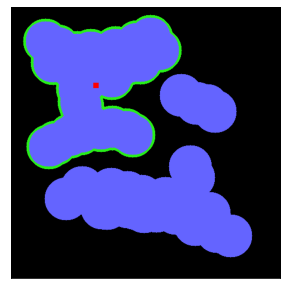

Area:  51867.0
Perimeter:  1341.3666543960571


In [56]:
img_ = np.copy(img)
cnt = contours[2]
M = cv2.moments(cnt)
cx = int(M['m10'] / M['m00'])
cy = int(M['m01'] / M['m00'])
cv2.drawContours(img_, [cnt], 0, (25, 240, 40), 3)
img_[cy-5:cy+5, cx-5:cx+5] = (0, 0, 255) # 質心
show_(img_, 5)
area = cv2.contourArea(cnt)
perimeter = cv2.arcLength(cnt, True)
print('Area: ', area)
print('Perimeter: ', perimeter)

### [`cv2.approxPolyDP(contour, epsilon, closed(bool))`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#ga0012a5fdaea70b8a9970165d98722b4c) 輪廓近似
* 設定是否抓取輪廓所有細節, optput是化簡的`np.array(contour)`
* epsilon 1% ~ 5% 週長(`cv2.arcLength(cnt,True)`)
* epsilon 越小越精細(同原始輪廓) 0 ~ 10%

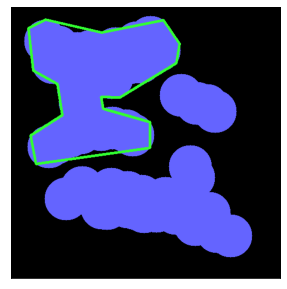

cnt    pts: 601
approx pts: 16


In [57]:
img_ = np.copy(img)
cnt = contours[2]
L = cv2.arcLength(cnt, True)
approx = cv2.approxPolyDP(cnt, L*0.01, True)
cv2.drawContours(img_, [approx], 0, (50, 255, 50), 3)
show_(img_, 5)

print('cnt    pts:', cnt.shape[0])
print('approx pts:', approx.shape[0])

### [`cv2.convexHull(contour)`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#ga014b28e56cb8854c0de4a211cb2be656) # 凸包
### [`cv2.isContourConvex(contour)`](https://docs.opencv.org/4.4.0/d3/dc0/group__imgproc__shape.html#ga8abf8010377b58cbc16db6734d92941b) # 檢查是否凸包

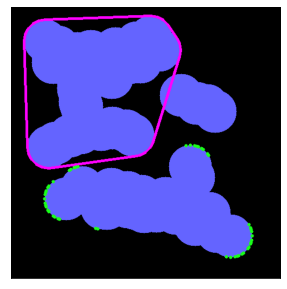

cnt is convex?  False
cnt is convex?  True


In [58]:
img_ = np.copy(img)
cnt = contours[2]
hull = cv2.convexHull(cnt)
cv2.drawContours(img_, [hull], -1, (255, 0, 255), 3)

cnt = contours[0]
r_hull = cv2.convexHull(cnt, returnPoints=False)
cv2.drawContours(img_, cnt[r_hull[:, 0]], -1, (25, 255, 25), 5)
show_(img_, 5)
print('cnt is convex? ', cv2.isContourConvex(cnt))
print('cnt is convex? ', cv2.isContourConvex(hull))

### [`cv2.boundingRect(contour)`](https://docs.opencv.org/4.2.0/d3/dc0/group__imgproc__shape.html#ga103fcbda2f540f3ef1c042d6a9b35ac7)
* output: x, y, w, h

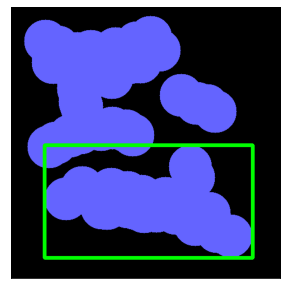

In [59]:
img_ = np.copy(img)
cnt = contours[0]

x, y, w, h = cv2.boundingRect(cnt)
cv2.rectangle(img_, (x, y), (x + w, y + h), (0, 255, 0), 5)
show_(img_, 5)

### 其他最小圖形範例

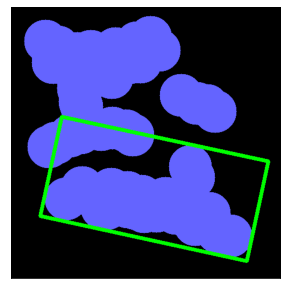

In [60]:
img_ = np.copy(img)
cnt = contours[0]

rect = cv2.minAreaRect(cnt)
box = cv2.boxPoints(rect)
box = np.int64(box)
cv2.drawContours(img_, [box], 0, (0, 255, 0), 5)
show_(img_, 5)

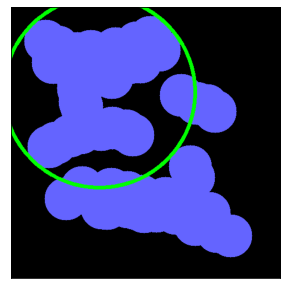

In [61]:
img_ = np.copy(img)
cnt = contours[2]

(x, y), radius = cv2.minEnclosingCircle(cnt)
center = (int(x), int(y))
radius = int(radius)
cv2.circle(img_, center, radius, (0, 255, 0), 5)
show_(img_, 5)

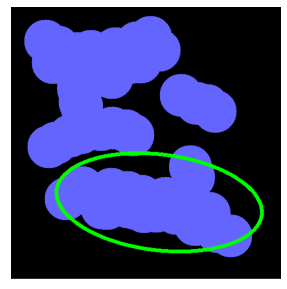

In [62]:
img_ = np.copy(img)
cnt = contours[0]

ellipse = cv2.fitEllipse(cnt)
cv2.ellipse(img_, ellipse, (0, 255, 0), 5)
show_(img_, 5)

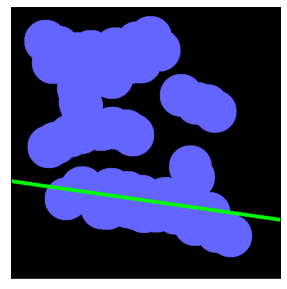

In [63]:
img_ = np.copy(img)
cnt = contours[0]

rows, cols = img.shape[:2]
[vx, vy, x, y] = cv2.fitLine(cnt, cv2.DIST_L2, 0, 0.01, 0.01)
lefty = int((-x * vy / vx) + y)
righty = int(((cols - x) * vy / vx) + y)
cv2.line(img_, (cols - 1, righty), (0, lefty), (0, 255, 0), 5)
show_(img_, 5)

### 最大內接圓(自刻)

### [`cv2.pointPolygonTest(contour, pt, measureDist)`](https://docs.opencv.org/4.4.0/d3/dc0/group__imgproc__shape.html#ga1a539e8db2135af2566103705d7a5722) # 測試點在輪廓的位置
* 在輪廓上 return 0
* 在外 retuen 負值
* 在內 retuen 正值
* 可輸出距離最近的距離

In [64]:
# 適用於凸包的輪廓 非凸包可能找到local maximum
def GetInsideCircleInfo(cnt, acc=1):
    x, y = cnt.mean(0)[0] # 粗算輪廓重心
    val = cv2.pointPolygonTest(cnt, (x, y), True)
    
    while True:
        # 檢驗圓心有沒有變
        x_ = x
        y_ = y
        
        if val == 0: # 在輪廓上
            break
            
        # 找尋 X 左右誰大
        tmp = cv2.pointPolygonTest(cnt, (x + acc, y), True)
        if tmp > val:
            val = tmp
            x += acc
        else:  
            tmp = cv2.pointPolygonTest(cnt, (x - acc, y), True)
            if tmp > val:
                val = tmp
                x -= acc
                
        # 找尋 Y 上下誰大
        tmp = cv2.pointPolygonTest(cnt, (x, y + acc), True)
        if tmp > val:
            val = tmp
            y += acc
        else:
            tmp = cv2.pointPolygonTest(cnt, (x, y - acc), True)
            if tmp > val:
                val = tmp
                y -= acc
        
        if x == x_ and y == y_:
            if acc < 0.1: # 精度夠了跳出
                break
                
            acc /= 2 # 精度更細
            
    return (x, y), val


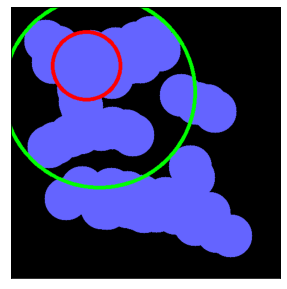

In [65]:
img_ = np.copy(img)
cnt = contours[2]

(x_, y_), radius_ = cv2.minEnclosingCircle(cnt) # 外接圓
center_ = (int(x_), int(y_))
radius_ = int(radius_)

(x, y), radius = GetInsideCircleInfo(cnt) # 內接圓
center = (int(x), int(y))
radius = int(radius)

cv2.circle(img_, center_, radius_, (0, 255, 0), 5)
cv2.circle(img_, center, radius, (0, 0, 255), 5)
show_(img_, 5)

## RGB 分布
### [`cv2.calcHist(imgs, channels, mask, histSize, ranges)`](https://docs.opencv.org/4.2.0/d6/dc7/group__imgproc__hist.html#ga4b2b5fd75503ff9e6844cc4dcdaed35d) # 分布線
* 有些需要用list包住
* `imgs`: `[img]`(list)
* `channels`: `[c]` 0, 1, 2 對應 B, G, R, `[0,1]`(2D)
* `mask`: 全圖設定 `None`
* `histSize`: 等高線數目  `[256], [180, 256]`(2D)
* `ranges`: 範圍 `[0, 256], [0, 180, 0, 256]`(2D)

#### Matplotlib code:
```python
for c in range(3):
    plt.hist(img[:, :, c].ravel(), 256, [0, 256], color=colors[c], alpha=0.6)
plt.xticks([]), plt.yticks([])
```

### [`cv2.equalizeHist(img)`](https://docs.opencv.org/4.2.0/d6/dc7/group__imgproc__hist.html#ga7e54091f0c937d49bf84152a16f76d6e) # 分布均勻化
* img 只能是單一 channel, 2D-array

![](https://docs.opencv.org/4.2.0/histogram_equalization.png)

In [66]:
# 寫個函數方便用
def color_hist(img, h=6, w=10):
    colors = ['b', 'g', 'r']
    plt.figure(figsize=(w, h))
    for c in range(3):
        hist = cv2.calcHist([img], [c], None, [256], [0, 256])
        plt.plot(hist, c=colors[c])
    plt.xticks([]), plt.yticks([])
    plt.show()

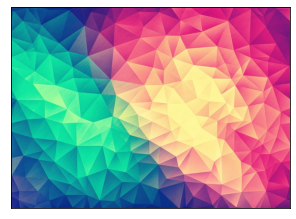

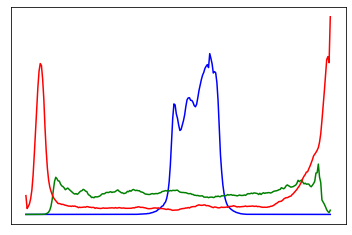

In [67]:
img = cv2.imread('data/fig1.jpg')
show_(img)
color_hist(img, 4, 6)

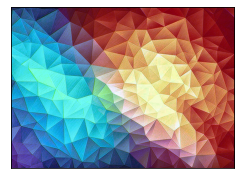

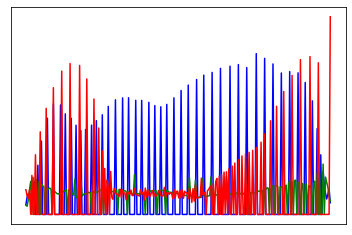

In [68]:
B, G, R = cv2.split(img)
eqB = cv2.equalizeHist(B)
eqG = cv2.equalizeHist(G)
eqR = cv2.equalizeHist(R)
img = cv2.merge((eqB, eqG, eqR))
show_(img, 4)
color_hist(img, 4, 6)

### [`createCLAHE(clipLimit(float), tileGridSize=Size(8, 8))`](https://docs.opencv.org/4.2.0/d6/dc7/group__imgproc__hist.html#gad689d2607b7b3889453804f414ab1018) 自適應亮度均勻
* 原理是分成小塊來處理均勻化, 使用內插法來彌補不同小塊的邊界來補正


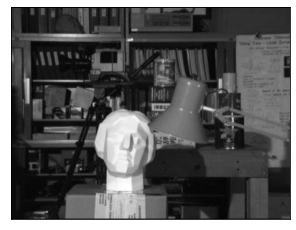

In [69]:
img = cv2.imread('data/p3.png', 0)
show_(img, 5)

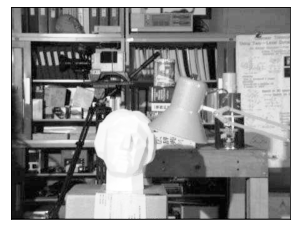

In [70]:
# 雕像部份失去細節
eqh = cv2.equalizeHist(img)
show_(eqh, 5)

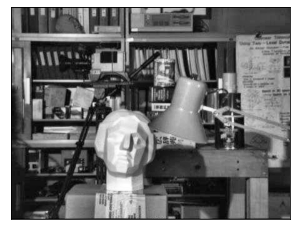

In [71]:
# create a CLAHE object (Arguments are optional).
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
cl1 = clahe.apply(img)
show_(cl1, 5)

## OpenCV COLOR 色彩空間轉換
### [HSV](https://zh.wikipedia.org/wiki/HSL%E5%92%8CHSV%E8%89%B2%E5%BD%A9%E7%A9%BA%E9%97%B4) 
<img src="https://upload.wikimedia.org/wikipedia/commons/a/a0/Hsl-hsv_models.svg" width="500px" >

### __Opencv 的HSV 與傳統HSV的不同__
* H 色相 (0-359) opencv(0-179)
* S 飽和 (0-100%)
* V 明度 (0-100%)
* （H/2, S*255, V*255) 投影到(0-179, 0-255, 0-255)
* 用 HSV 空間輕鬆抓出顏色種類

### 2D Histogram
* 將圖片轉為色彩空間為HSV
* H (0-179) 色相 (360")
* S (0-255) 飽和度 (%)

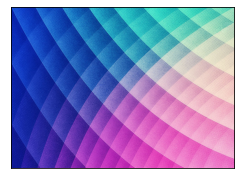

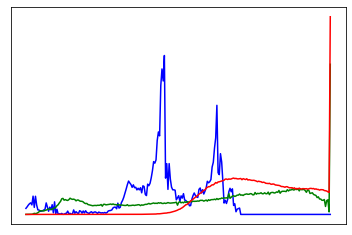

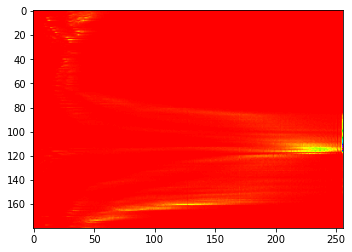

In [72]:
img = cv2.imread('data/fig2.jpg')
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
# H(0~179) S(0~255) V(0~255) 
hist = cv2.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256]) 
show_(img, 4)
color_hist(hsv, 4, 6) # plot func
plt.imshow(hist, cmap=matplotlib.cm.hsv)

### [`cv2.normalize(img, dst, alpha=1, beta=0, norm_type=cv2.NORM_L2)`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#ga7bcf47a1df78cf575162e0aed44960cb) # 正規化
* [`Norm Types`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#gad12cefbcb5291cf958a85b4b67b6149f)
* `cv2.normalize(img, dst, min, max, cv2.NORM_MINMAX)` 線性縮放
    * `dst` : 可放入img 直接轉換
    * (img-img.min) * (max-min) / (img.max-img.min)
    * 線性縮放, 和cv2.equalizeHis不同

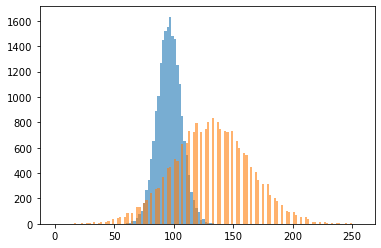

In [73]:
arr = np.uint8(np.random.normal(96, 10, (20000)))
plt.hist(arr, 128, [0, 256], alpha=0.6)
cv2.normalize(arr, arr, 0 , 255, cv2.NORM_MINMAX)
plt.hist(arr, 128, [0, 256], alpha=0.6)
plt.show()

## 直方圖的反向投影  [Histogram Backprojection](https://docs.opencv.org/4.2.0/dc/df6/tutorial_py_histogram_backprojection.html)
* [參考資料1](https://theailearner.com/2019/04/18/histogram-backprojection/)
* 適合找到同樣紋理的特徵
* 黑, 灰, 白 不容易辨識

### [`cv2.calcBackProject(imgs, channels, hist, ranges, scale)`](https://docs.opencv.org/4.2.0/d6/dc7/group__imgproc__hist.html#gab644bc90e7475cc047aa1b25dbcbd8df)
* 輸入hist(float32), 輸出(uint8), 會自動四捨五入
* 有些需要用list包住
* `imgs`: `[img]`(list)
* `channels`: `[c]` (0, 1, 2) 對應 (B, G, R) or (H, S, V), `[0,1]`(2D)
* `hist`: 由`cv2.calcHist` 算出的 2D資料(float32), 需要正規化(線性縮放)(0~255) 不然影響後面的運算最大值, 這裡資料格式一定要float32, 不然差異很大
* `ranges`: 範圍 `[0, 256], [0, 180, 0, 256]`(2D)
* 不會像是Numpy 一樣處理 R M I, 好像直接轉換而已
* hist 最大值若是超過255 輸出會轉成255

C:\Users\22001061\AppData\Local\Temp\ipykernel_12132\1689643170.py:12: RuntimeWarning: invalid value encountered in true_divide
  R = M / I # 會有除以0的報錯 nan


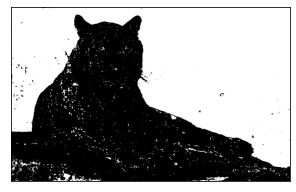

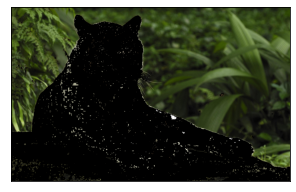

In [74]:
# numpy
target = cv2.imread('data/tiger.jpg')
hsvt = cv2.cvtColor(target, cv2.COLOR_BGR2HSV)
roi = target[:690, 950:]
hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)

# Find the histograms using calcHist. Can be done with np.histogram2d also
M = cv2.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])
I = cv2.calcHist([hsvt], [0, 1], None, [180, 256], [0, 180, 0, 256])

# M 是擷取自 I, 一定比較小, R.max()<=1
R = M / I # 會有除以0的報錯 nan
R = np.nan_to_num(R) # np.nan 轉成0

# 把所有點位在新的R中轉換值, 有沒有突出的值, 設定濾鏡
h, s, v = cv2.split(hsvt)
B = R[h.ravel(), s.ravel()]
B = B.reshape(hsvt.shape[:2])
cv2.normalize(B, B, 0, 255, cv2.NORM_MINMAX) # 線性縮放
B = np.uint8(B)

# 主要是把分散的點位連接在一起, 基本上是膨脹操作
disc = np.ones((3, 3))
B = cv2.filter2D(B, -1, disc)
ret, thresh = cv2.threshold(B, 50, 255, cv2.THRESH_BINARY)

# thresh = ~thresh # 變成老虎mask
thresh = cv2.merge((thresh, thresh, thresh))
show_(thresh, 5)
res = cv2.bitwise_and(target, thresh)
show_(res, 5)

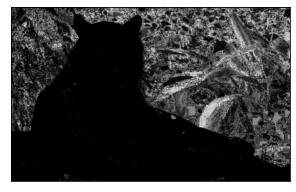

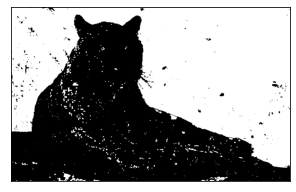

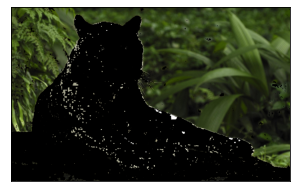

In [75]:
target = cv2.imread('data/tiger.jpg')
hsvt = cv2.cvtColor(target, cv2.COLOR_BGR2HSV)
roi = target[:690, 950:]
hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)

# calculating object histogram
roihist = cv2.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])

# normalize histogram and apply backprojection
cv2.normalize(roihist, roihist, 0, 255, cv2.NORM_MINMAX)  # 線性縮放
dst = cv2.calcBackProject([hsvt], [0, 1], roihist, [0, 180, 0, 256], 1)
show_(dst, 5)

# 主要是把分散的點位連接在一起, 基本上是膨脹操作
disc = np.ones((5, 5))
cv2.filter2D(dst, -1, disc, dst)

# threshold and binary AND
ret, thresh = cv2.threshold(dst, 50, 255, 0)
thresh = cv2.merge((thresh, thresh, thresh))
res = cv2.bitwise_and(target, thresh)
show_(thresh, 5)
show_(res, 5)

### `cv2.calcBackProject` 輸入必須是`np.float32` 輸出`np.uint8`

M
shape: (180, 256)
min: 0.0
max: 255.0
mean: 0.3102864623069763
std: 4.422047138214111
dtype: float32

B1
shape: (935, 1337)
min: 0
max: 255
mean: 19.55251880857055
std: 40.741181745618015
dtype: uint8



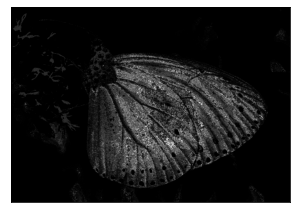

B2
shape: (935, 1337)
min: 0
max: 255
mean: 19.55251880857055
std: 40.741181745618015
dtype: uint8



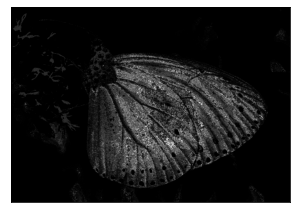

B1 Same B2?  True


In [76]:
target = cv2.imread('data/gg.png')
hsvt = cv2.cvtColor(target, cv2.COLOR_BGR2HSV)
roi = target[250:650, 425:925]
hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)

M = cv2.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])
max_val = 255
cv2.normalize(M, M, 0, max_val, cv2.NORM_MINMAX)  # 線性縮放
M = np.round(M) # 即使使用的整數
# M = np.uint8(M) # 變化很大
img_info(M, 'M')

#numpy
h, s, v = cv2.split(hsvt)
B1 = M[h.ravel(), s.ravel()]
B1 = B1.reshape(hsvt.shape[:2])
B1 = np.minimum(B1, 255) # 若是 M.max() > 255 == 255
B1 = np.uint8(B1) # 主動轉成 uint8 完全一樣

# openCV
B2 = cv2.calcBackProject([hsvt], [0, 1], M, [0, 180, 0, 256], 1)

# info
img_info(B1, 'B1')
show_(B1)
img_info(B2, 'B2')
show_(B2)

print('B1 Same B2? ', np.all(B1 == B2))

## High Dynamic Range (HDR) # 高動態範圍
>* 不同曝光度的照片合成

In [77]:
# Loading exposure images into a list
img_fn = ['HDR-4.jpeg', 'HDR-2.jpeg', 'HDR+2.jpeg', 'HDR+4.jpeg']
img_list = [cv2.imread('data/'+fn) for fn in img_fn]
exposure_times = np.array([15.0, 2.5, 0.25, 0.0333], dtype=np.float32)

In [78]:
# Merge exposures to HDR image
merge_debevec = cv2.createMergeDebevec()
hdr_debevec = merge_debevec.process(img_list, times=exposure_times.copy())
merge_robertson = cv2.createMergeRobertson()
hdr_robertson = merge_robertson.process(img_list, times=exposure_times.copy())

In [79]:
# Tonemap HDR image
tonemap1 = cv2.createTonemap(gamma=2.2)
res_debevec = tonemap1.process(hdr_debevec.copy())

In [80]:
# Exposure fusion using Mertens
merge_mertens = cv2.createMergeMertens()
res_mertens = merge_mertens.process(img_list)

In [81]:
# Convert datatype to 8-bit and save
res_debevec_8bit = np.clip(res_debevec * 255, 0, 255).astype('uint8')
# res_robertson_8bit = np.clip(res_robertson * 255, 0, 255).astype('uint8')
res_mertens_8bit = np.clip(res_mertens * 255, 0, 255).astype('uint8')

# cv2.imwrite("ldr_debevec.jpg", res_debevec_8bit)
# cv2.imwrite("ldr_robertson.jpg", res_robertson_8bit)
# cv2.imwrite("fusion_mertens.jpg", res_mertens_8bit)

## [Fourier Transform](https://docs.opencv.org/4.2.0/dd/dc4/tutorial_py_table_of_contents_transforms.html)
* DFT 的效率OpenCV 會快於Numpy
* DFT 效率像素為2, 3, 5 的倍數時效率也會比較好, 可以用補0的方式來補足
* __`cv2.getOptimalDFTSize(num)`__
    * 可以用此函數計算適合的像素大小

### [`cv2.dft(img, flags=0)`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#gadd6cf9baf2b8b704a11b5f04aaf4f39d)
* `np.fft.fft2`

### [`cv2.idft(img, flags=0)`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#gaa708aa2d2e57a508f968eb0f69aa5ff1)
* `np.fft.ifft2`

#### [`DftFlags`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#gaf4dde112b483b38175621befedda1f1c) # 輸出類型

### [`cv2.magnitude(real-array, imag-array)`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#ga6d3b097586bca4409873d64a90fe64c3) # 同複數絕對值
* $\texttt{dst} (I) = \sqrt{\texttt{x}(I)^2 + \texttt{y}(I)^2}$
* np.abs()

### `np.fft.fftshift()` # 轉換排序
* `5432112345 --> 1234554321` 一維二維都可以
* `img = np.fft.fftshift(np.fft.fftshift(img))` 轉換兩次恢復

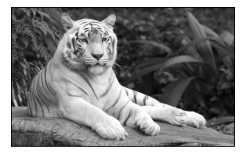

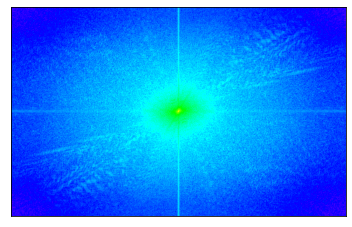

In [82]:
img = cv2.imread('data/tiger.jpg', 0)
ft = np.fft.fft2(img)
ft_sft = np.fft.fftshift(ft)
show_(img, 4)
plt.imshow(np.log(np.abs(ft_sft)), cmap=matplotlib.cm.hsv_r) # 複數絕對值
plt.xticks([]), plt.yticks([])
plt.show()

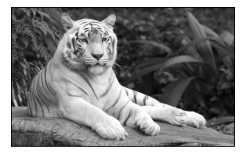

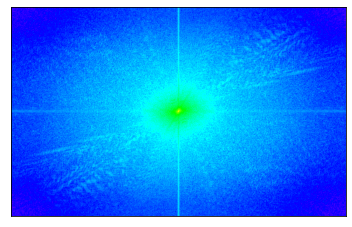

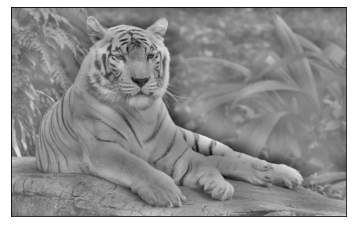

In [83]:
img = cv2.imread('data/tiger.jpg', 0)
ft = np.fft.fft2(img)
ft_sft = np.fft.fftshift(ft)
show_(img, 4)
plt.imshow(np.log(np.abs(ft_sft)), cmap=matplotlib.cm.hsv_r) # 複數絕對值
plt.xticks([]), plt.yticks([])
plt.show()

rows, cols = img.shape
crow, ccol = rows // 2, cols // 2
# 過濾高頻
r = 5
ft_sft[crow - r:crow + r + 1, ccol - r:ccol + r + 1] = 0
ift = np.fft.ifft2(np.fft.fftshift(ft_sft))
img_back = ift.real
plt.imshow(img_back, cmap='gray')
plt.xticks([]), plt.yticks([])
plt.show()


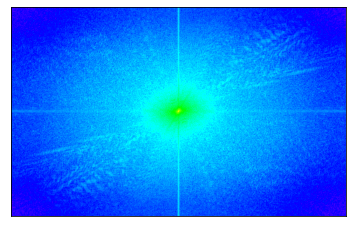

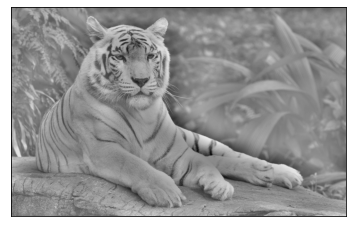

In [84]:
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum = np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
plt.imshow(magnitude_spectrum, cmap=matplotlib.cm.hsv_r)
plt.xticks([]), plt.yticks([])
plt.show()

# create a mask first, center square is 1, remaining all zeros
mask = np.ones((rows, cols, 2), np.uint8)
mask[crow - r:crow + r, ccol - r:ccol + r] = 0

# apply mask and inverse DFT
fshift = dft_shift * mask
f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = img_back[:, :, 0] # 取 real
# img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

plt.imshow(img_back, cmap='gray')
plt.xticks([]), plt.yticks([])
plt.show()

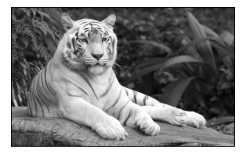

C:\Users\22001061\AppData\Local\Temp\ipykernel_12132\2424722692.py:16: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = np.log(cv2.magnitude(dft[:, :, 0], dft[:, :, 1]))


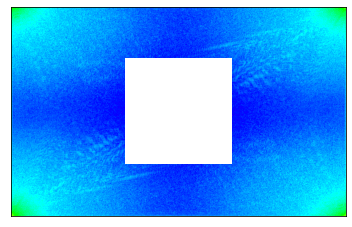

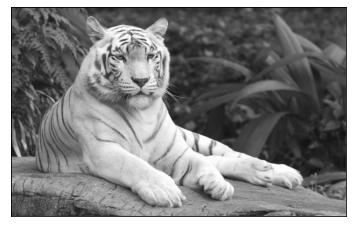

In [85]:
# 低頻濾波
show_(img, 4)
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)

# create a mask first, center square is 1, remaining all zeros
r = 300
mask = np.ones((rows, cols, 2), np.uint8)
mask[crow - r:crow + r, ccol - r:ccol + r] = 0

# apply mask and inverse DFT
dft = (dft * mask)
img_back = cv2.idft(dft)
img_back = img_back[:, :, 0] # 取 real

# dft img
magnitude_spectrum = np.log(cv2.magnitude(dft[:, :, 0], dft[:, :, 1]))
plt.imshow(magnitude_spectrum, cmap=matplotlib.cm.hsv_r)
plt.xticks([]), plt.yticks([])
plt.show()

# img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])
plt.imshow(img_back, cmap='gray')
plt.xticks([]), plt.yticks([])
plt.show()

## [Template Matching](https://docs.opencv.org/4.2.0/d4/dc6/tutorial_py_template_matching.html)

### [`cv2.matchTemplate(img, temp, method)`](https://docs.opencv.org/4.2.0/df/dfb/group__imgproc__object.html#ga586ebfb0a7fb604b35a23d85391329be)
*  8-bit or 32-bit 灰階彩色都可以
* 原始圖片shape: H, W
* 搜尋圖片shape: h, w
* 輸出Array shape: H - h + 1, W - w + 1
* method: [`TemplateMatchModes`](https://docs.opencv.org/4.2.0/df/dfb/group__imgproc__object.html#ga3a7850640f1fe1f58fe91a2d7583695d)

### [`cv2.minMaxLoc(img)`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#gab473bf2eb6d14ff97e89b355dac20707)
* output: `minVal, maxVal, minLoc, maxLoc`
* 輸出最大值和最小值的位置

find castle:


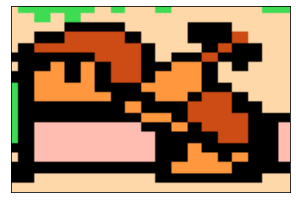

max: 90822264.0
min: -34178016.0


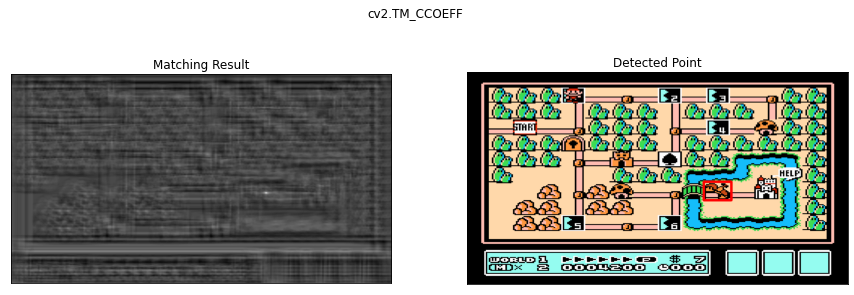

max: 1.0
min: -0.36539873480796814


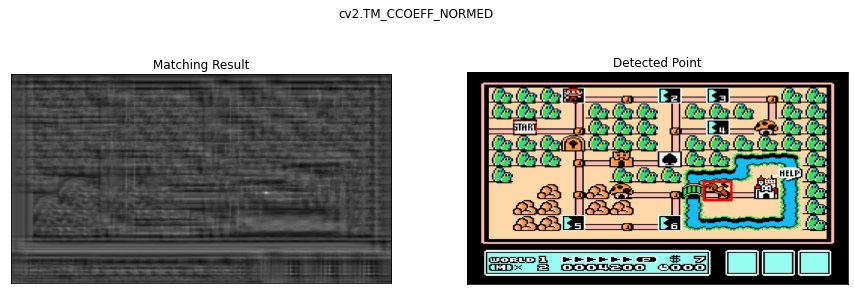

max: 246287072.0
min: 16918500.0


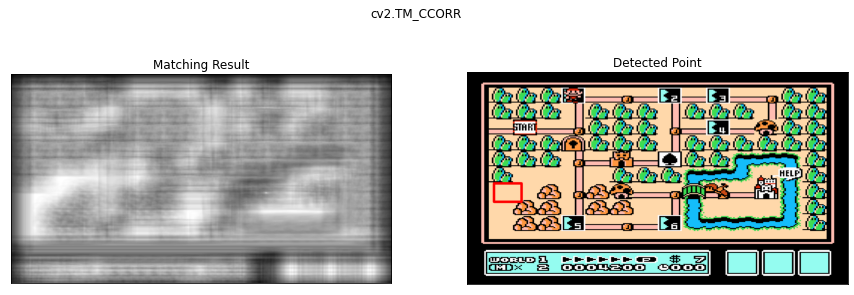

max: 1.0
min: 0.16528712213039398


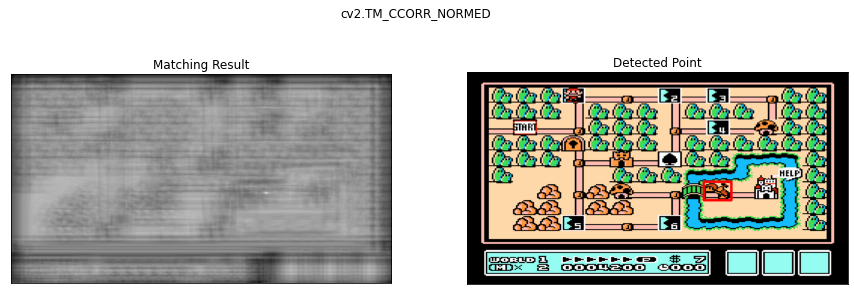

max: 291866304.0
min: 0.0


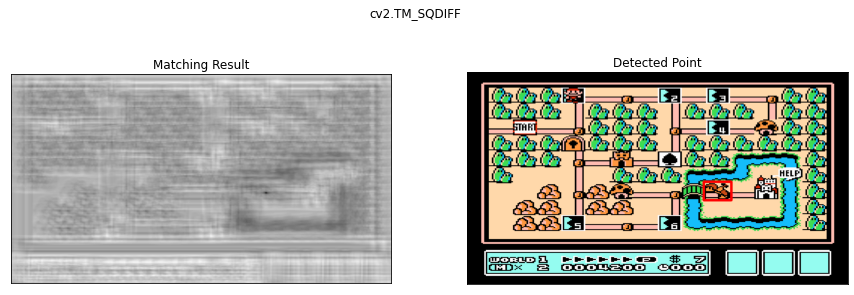

max: 1.0
min: 0.0


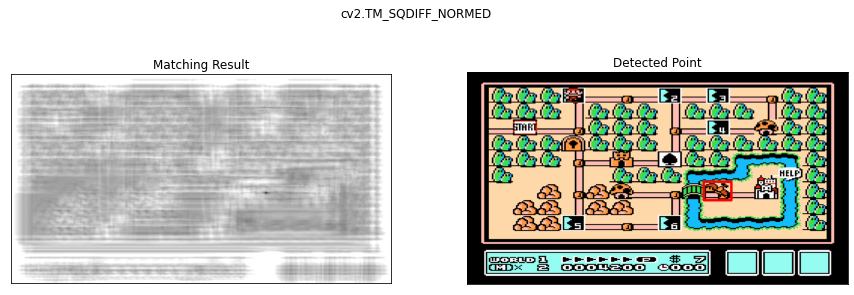

In [86]:
o_img = cv2.imread('data/mario.png')
template = o_img[480:560, 1030:1150]
print('find castle:')
show_(template, 5)

img_g = cv2.cvtColor(o_img, cv2.COLOR_BGR2GRAY)
template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
h, w = template.shape

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR', 'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']
for meth in methods:
    img2 = img_g.copy()
    method = eval(meth)

    # Apply template Matching
    res = cv2.matchTemplate(img2, template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    print('max:', max_val)
    print('min:', min_val)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum 這兩種取最小值
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
        
    bottom_right = (top_left[0] + w, top_left[1] + h)
    img = o_img.copy()
    cv2.rectangle(img, top_left, bottom_right, (0, 0, 255), 10)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(15, 5))
    plt.subplot(121), plt.imshow(res, cmap='gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(img, cmap='gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    plt.show()

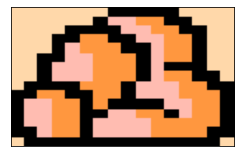

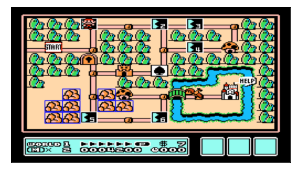

In [87]:
img_rgb = cv2.imread('data/mario.png')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
template_rgb = img_rgb[491:556, 306:410]
show_(template_rgb, 4)
template = cv2.cvtColor(template_rgb, cv2.COLOR_BGR2GRAY)
w, h = template.shape[::-1]
res = cv2.matchTemplate(img_gray, template, cv2.TM_CCOEFF_NORMED)
threshold = 0.8 # 相似度設定
loc = np.where(res >= threshold) # 回傳True 的index
for pt in zip(*loc[::-1]):
    cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (255, 25, 25), 2)

show_(img_rgb)

## [Hough Line Transform](https://docs.opencv.org/4.2.0/d6/d10/tutorial_py_houghlines.html) find line
* [解說1](https://zh.wikipedia.org/wiki/%E9%9C%8D%E5%A4%AB%E5%8F%98%E6%8D%A2)
* [解說2](https://medium.com/@bob800530/hough-transform-cf6cb8337eac)
* [解說影片](https://www.youtube.com/watch?v=4zHbI-fFIlI)
* 平面的一條線可以投影在 ρ, θ平面 的一個點上, 公式如下
    * $\rho = x \cos \theta + y \sin \theta$
* 遍歷所有的點(x, y), 並跑出所有的角度(θ)直線, 在投影到 ρ, θ平面上並記數, 同一條直線的多個點都會跑到相同角度上累計ρ, θ平面上的那個點
![](https://upload.wikimedia.org/wikipedia/commons/e/e6/R_theta_line.GIF)

### [`cv2.HoughLines(image, ρ(像素最小單位), θ(角度最小單位), threshold)`](https://docs.opencv.org/4.2.0/dd/d1a/group__imgproc__feature.html#ga46b4e588934f6c8dfd509cc6e0e4545a)
* output: `ρ, θ`
* `img`: 吃二值化圖片
* `threshold`: 閥值(累積數目, 那條線有幾個點)
* 只能抓出一整條線, 不能知道其長度

### [`cv2.HoughLinesP(image, ρ(像素最小單位), θ(角度最小單位), threshold, minLineLength, maxLineGap)`](https://docs.opencv.org/4.2.0/dd/d1a/group__imgproc__feature.html#ga8618180a5948286384e3b7ca02f6feeb)
* `minLineLength`: 最短線條設定
* `maxLineGa`: 線條最大間隔

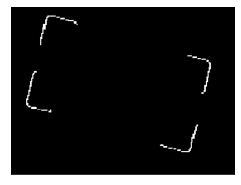

In [88]:
# Numpy code
img = cv2.imread('data/hough.png', 0)
img = cv2.resize(img, (400, 300))
img = cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)[1]
show_(img, 4)

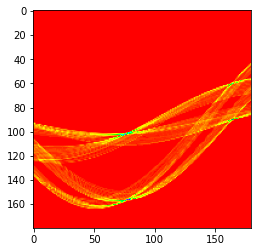

In [89]:
coor = np.where(img == 255)
x = coor[0] + 1 
y = coor[1] + 1 

θ = np.linspace(0, 180, num=180, endpoint=False)
sinθ = np.sin(np.deg2rad(θ))
cosθ = np.cos(np.deg2rad(θ))
ρ = (x.reshape((-1, 1)) * cosθ) + (y.reshape((-1, 1)) * sinθ)

arr = np.zeros((1000, 180))

for θ_ in range(180):
    for ρ_ in ρ[:, θ_]:
        arr[int(500 + ρ_), θ_] += 1
        
plt.imshow(cv2.resize(arr, (180, 180)), cmap=matplotlib.cm.hsv)

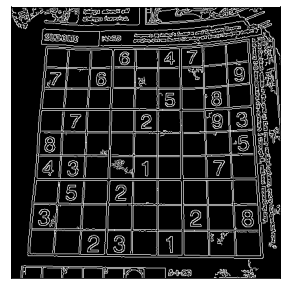

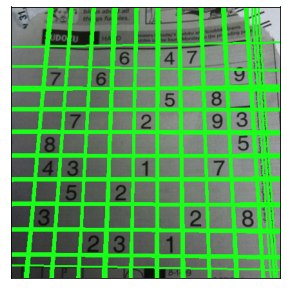

In [90]:
img = cv2.imread('data/dave.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 0, 100, apertureSize=3)
show_(edges, 5)
lines = cv2.HoughLines(edges, 1, np.pi / 720, 180)
for line in lines:
    ρ, θ = line[0]
    a = np.cos(θ)
    b = np.sin(θ)
    x0 = a * ρ
    y0 = b * ρ
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(img, (x1, y1), (x2, y2), (25, 255, 25), 2)
show_(img, 5)

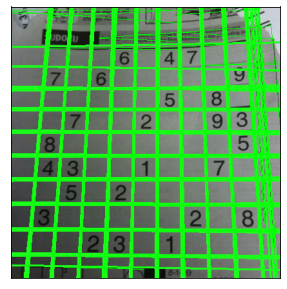

In [91]:
lines = cv2.HoughLinesP(edges, 1, np.pi / 180, 100, minLineLength=100, maxLineGap=20)
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 1)
show_(img, 5)


## [Hough Circle Transform](https://docs.opencv.org/4.2.0/da/d53/tutorial_py_houghcircles.html) find circle
* 圓形需要三個參數描述, 轉換的Hough空間為三維

### [`cv2.HoughCircles(image, method, dp, minDist, param1, param2, minRadius, maxRadius)`](https://docs.opencv.org/4.2.0/dd/d1a/group__imgproc__feature.html#ga47849c3be0d0406ad3ca45db65a25d2d)
* [`method`](https://docs.opencv.org/4.2.0/dd/d1a/group__imgproc__feature.html#ga073687a5b96ac7a3ab5802eb5510fe65)
* minDist 不同弧的圓心多靠近視為同一個圓形
* param1 傳入canny 的高閥值, 低閥值自動為0.5倍數
* minRadius 最小圓半徑
* maxRadius 最大圓半徑

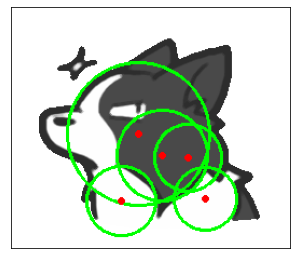

In [92]:
img = cv2.imread('data/p1.png', 0) - 1 
img = cv2.medianBlur(img, 5) # 中位數濾鏡
cimg = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, 1, 20, param1=50, param2=30, minRadius=0, maxRadius=0)
circles = np.uint16(np.around(circles))
for i in circles[0, :]:
    # draw the outer circle
    cv2.circle(cimg, (i[0], i[1]), i[2], (0, 255, 0), 2)
    # draw the center of the circle
    cv2.circle(cimg, (i[0], i[1]), 2, (0, 0, 255), 2)
show_(cimg, 5)


# [Image Segmentation with Watershed Algorithm](https://docs.opencv.org/4.2.0/d3/db4/tutorial_py_watershed.html) 分水嶺影像分隔
* 一張灰度圖片都能視為一張2D等高線圖, 假設在這個地形慢慢加入水, 就等於是圖片的簡單閥值問題
* 那我們能不能在這個地形上蓋上'水壩', 基於我們想要特別保護的地方？

### [`cv2.watershed(image, markers)`](https://docs.opencv.org/4.2.0/d7/d1b/group__imgproc__misc.html#ga3267243e4d3f95165d55a618c65ac6e1)

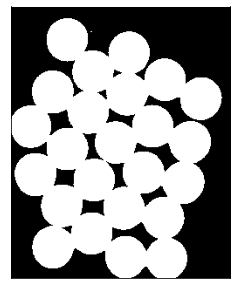

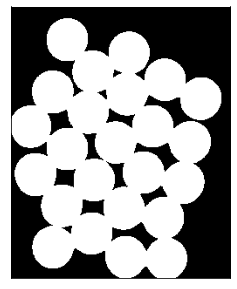

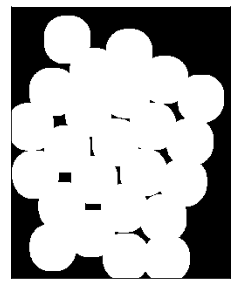

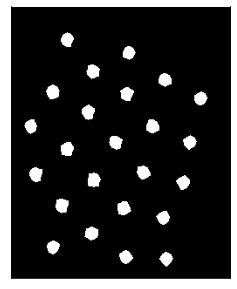

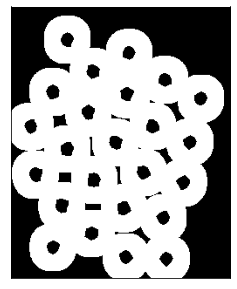

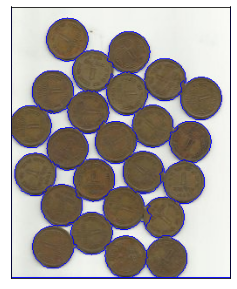

In [93]:
img = cv2.imread('data/coins.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Otsu's 二值化
ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
show_(thresh)

# noise removal 開運算 吃掉白色小雜訊
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
show_(opening)

# sure background area 膨脹
sure_bg = cv2.dilate(opening, kernel, iterations=3)
show_(sure_bg)

# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
show_(sure_fg)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)
show_(unknown)

# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers + 1

# Now, mark the region of unknown with zero
markers[unknown == 255] = 0

markers = cv2.watershed(img, markers)
img[markers == -1] = [255, 0, 0]
show_(img)

## [GrabCut Algorithm 演算法分離背景前景](https://docs.opencv.org/4.2.0/d8/d83/tutorial_py_grabcut.html)
* 在圖片上將前景用一個方框包圍(方框外必定是背景)
* 在用像素的特徵(顏色, 位置)來建立一個高斯混合模型, 來判斷前景背景的可能性！
* 除此之外, 和已經判斷為背景的像素相鄰都會加強為背景的權重...等方式加強準確

### [`cv2.grabCut(img, mask, rect, bgdModel, fgdModel, iterCount, mode)`](https://docs.opencv.org/4.2.0/d7/d1b/group__imgproc__misc.html#ga909c1dda50efcbeaa3ce126be862b37f)
*  [`mask`](https://docs.opencv.org/4.2.0/d7/d1b/group__imgproc__misc.html#gad43d3e4208d3cf025d8304156b02ba38) 指定部份為前後景
* `rect` :(x, y, w, h)
* `bdgModel, fgdModel` 一個shape:(1, 65)資料格式np.float64 的 np.array
* `iterCount`: 迭代次數
* [`mode`](https://docs.opencv.org/4.2.0/d7/d1b/group__imgproc__misc.html#gaf8b5832ba85e59fc7a98a2afd034e558)

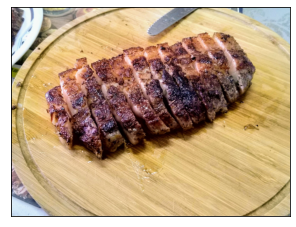

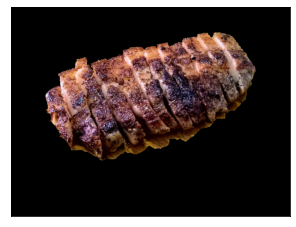

In [94]:
img = cv2.imread('data/meat.jpg')
img = cv2.resize(img, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA)
show_(img, 5)

mask = np.zeros(img.shape[:2], np.uint8)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)
rect = (80, 60, 640, 400) # img[60:400, 80:640]

cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
img = img * mask2[:, :, np.newaxis]

show_(img, 5)

# [特徵擷取](https://docs.opencv.org/4.2.0/db/d27/tutorial_py_table_of_contents_feature2d.html)

## [Harris Cornor 角特徵擷取](https://docs.opencv.org/4.2.0/dc/d0d/tutorial_py_features_harris.html)
* 概念在圖片的一個小範圍內移動(u, v)距離, 判斷跟原本的範圍差距(差平方和)大小
    * $E(u,v) = \sum_{x,y} \underbrace{w(x,y)}_\text{window function} \, [\underbrace{I(x+u,y+v)}_\text{shifted intensity}-\underbrace{I(x,y)}_\text{intensity}]^2$
    * $w(x,y)$ 視窗函數, 通常為高斯或是mean filter
* 上式泰勒展開近似: $E(u,v) \approx \begin{bmatrix} u & v \end{bmatrix} M \begin{bmatrix} u \\ v \end{bmatrix}$
    * 其中判斷矩陣: $M = \sum_{x,y} w(x,y) \begin{bmatrix}I_x I_x & I_x I_y \\ I_x I_y & I_y I_y \end{bmatrix}$
    * 判斷矩陣的兩個特徵值來判斷是否有大量變化
* 最後取經驗公式: $R = \lambda_1 \lambda_2 - k(\lambda_1+\lambda_2)^2 = R = det(M) - k(trace(M))^2$
    * 用R 來判斷是否為角
    * k 經驗取0.04~0.06
* Harris 不受圖片旋轉的影響都可以找到角
* [參考資料1](https://blog.csdn.net/lwzkiller/article/details/54633670)
* [參考資料2](https://zhuanlan.zhihu.com/p/42490675)
* [參考資料3](https://www.cnblogs.com/ronny/p/4009425.html)

### [`cv2.cornerHarris(img, blockSize, ksize, k)`](https://docs.opencv.org/4.2.0/dd/d1a/group__imgproc__feature.html#gac1fc3598018010880e370e2f709b4345)
* `img` 需要轉為 np.float32() 格式
* `blockSize` 角檢測需要考慮的大小(u, v ???)
* `ksize` 檢測 filter大小(奇數)
* `k` (0.04~0.06)

shape: (256, 256)
min: -2704608.5
max: 7150541.0
mean: 8294.1455078125
std: 225383.078125
dtype: float32



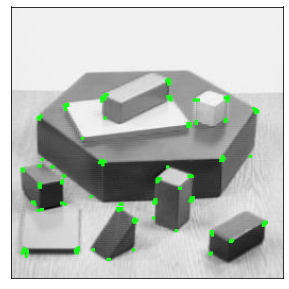

In [95]:
img = cv2.imread('data/corner.jpg')

# img = cv2.resize(img, (640, 480))
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)

# 输入图像必 是 float32 最后一个参数在 0.04 到 0.06 之间
dst = cv2.cornerHarris(gray, 2, 3, 0.05)

# result is dilated for marking the corners, not important
dst = cv2.dilate(dst, None) # 腐蝕

# Threshold for an optimal value, it may vary depending on the image.
img_info(dst)
img[dst > 0.01 * dst.max()] = [25, 255, 25]
show_(img, 5)

## [Shi-Tomasi Corner Detector & Good Features to Track](https://docs.opencv.org/4.2.0/d4/d8c/tutorial_py_shi_tomasi.html)
* 修改Harris 的角判斷式 $R = min(\lambda_1, \lambda_2)$
### [`cv2.goodFeaturesToTrack(img, maxCorners, qualityLevel, minDistance, corners, mask, blockSize, useHarrisDetector, k)`](https://docs.opencv.org/4.2.0/dd/d1a/group__imgproc__feature.html#ga1d6bb77486c8f92d79c8793ad995d541)
* output 回傳前 N 個最好的點位
* `maxCorners`: N (-1 所有的角)
* `qualityLevel`:(float) 質量等級
* `minDistance`: 角度的歐基里得距離
* `mask`: 檢測範圍設定
* `blockSize`: 角檢測需要考慮的大小(u, v ???)
* `useHarrisDetector`: 使用Harris檢測
* `k`: Harris的參數

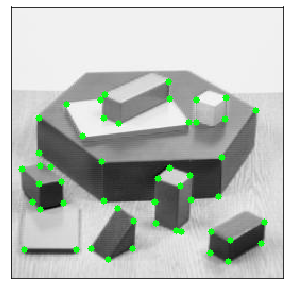

In [88]:
img = cv2.imread('data/corner.jpg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(gray, 50, 0.01, 5)

for i in corners:
    x, y = i[0]
    # cv2.circle(img, center, radius, color, thickness)
    cv2.circle(img, (x, y), 3, (25, 255, 14), -1)

show_(img)

# [特徵點](https://chtseng.wordpress.com/2019/10/17/panorama/)
## [SIFT (Scale-Invariant Feature Transform)](https://docs.opencv.org/4.2.0/da/df5/tutorial_py_sift_intro.html) # 4.2沒有此演算法
* 當圖片在尺度變化上, 可能會影像角的搜尋(SIFT就是幫助在尺寸上尋找)
* 在一張圖中利用特徵點找到另外一張圖的的另一個東西
![](https://img-my.csdn.net/uploads/201207/09/1341794478_9911.png)
* 本算法特徵就是對不同圖片中 物件的大小影響不大(都能擷取到)
* 原圖 -> 高斯濾鏡G11 -> 高斯濾鏡G12 -> 高斯濾鏡G13 -> 降採樣縮小G21 -> 高斯濾鏡G22 -> 高斯濾鏡G23 -> 降採樣縮小G31 -> 高斯濾鏡G32 -> 高斯濾鏡G33
* 將同層(same shape)取 [DOG (Difference of Gaussians)](https://zh.wikipedia.org/wiki/%E9%AB%98%E6%96%AF%E5%B7%AE), 只有原層數-1的DOG-img
* 將同層(same shape)的DOG-img 相疊(3 維度資料)
* 在三維資料比較周圍的數值, 共9(up) + 8(self) + 9(down) 26點位比較, 只有原層數-3 DOG-img 可以參與比較(兩邊無法比較)
* [資料參考1](http://weitz.de/sift/index.html?size=large)
* [資料參考2](https://www.twblogs.net/a/5bfe2416bd9eee7aec4e41a8)
* 需要安裝模組 `pip install opencv-contrib-python==3.4.2.17` 需要安裝舊一點版本

### [`cv2.drawKeypoints(img, keypoints, out_img, color, flags)`](https://docs.opencv.org/4.2.0/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920)
* [`keypoints`](https://docs.opencv.org/4.2.0/d2/d29/classcv_1_1KeyPoint.html) (list), kp-data
    * 屬性如下
    * `angle`
    * `pt` 座標
    * `size`
* [`flag`- DRAW_MATCHES_FLAGS](https://docs.opencv.org/4.2.0/d4/d5d/group__features2d__draw.html#gga2c2ede79cd5141534ae70a3fd9f324c8a5b39c8b553c821e7cddc6da64b5bd2ee)

### 特徵點匹配
* [範例1](https://www.cnblogs.com/skyfsm/p/7401523.html)
* [範例2](https://chtseng.wordpress.com/2017/05/22/%e5%9c%96%e5%83%8f%e7%89%b9%e5%be%b5%e6%af%94%e5%b0%8d%e4%ba%8c-%e7%89%b9%e5%be%b5%e9%bb%9e%e6%8f%8f%e8%bf%b0%e5%8f%8a%e6%af%94%e5%b0%8d/)

## [SURF(Speeded-Up Robust Features)](https://docs.opencv.org/4.2.0/df/dd2/tutorial_py_surf_intro.html)
* 快速版SIFT
* 斑點檢測器

## [FAST Algorithm for Corner Detection 角點檢測算法](https://docs.opencv.org/4.2.0/df/d0c/tutorial_py_fast.html)
* 決定中間點是不是'角點'的方式是比較周圍16點的灰度
* 若是有超過"連續"n個點的灰度是超過設定的範圍內(中間灰度+-t, t閥值)
![](https://docs.opencv.org/4.2.0/fast_speedtest.jpg)
* 更快的方式先選垂直和水平的點位檢測
* Machine Learning a Corner Detector
    * 利用找到的角點的16個比較點位來張開一個向量P(16個參數)
    * 每個點位簡單的分成三種 ![](https://docs.opencv.org/4.2.0/fast_eqns.jpg)
    * y 是不是角點(bool), 模型使用決策樹
* 對角點檢測非常快, 但是再有雜訊時表現不佳(無法連續)


Threshold: 10
nonmaxSuppression:True
neighborhood: 2
Total Keypoints with nonmaxSuppression: 431


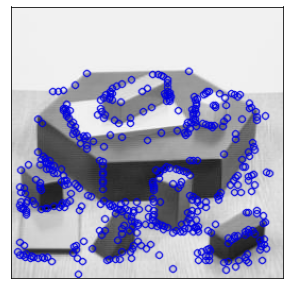

Total Keypoints with nonmaxSuppression: 1575


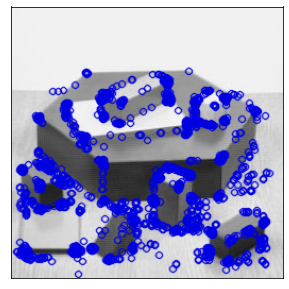

In [97]:
img = cv2.imread('data/corner.jpg', 0)

# Initiate FAST object with default values
fast = cv2.FastFeatureDetector_create()

# find and draw the keypoints
kp = fast.detect(img, None)
img2 = cv2.drawKeypoints(img, kp, None, color=(225, 0, 0))

# Print all default params
print(f"Threshold: {fast.getThreshold()}")
print(f"nonmaxSuppression:{fast.getNonmaxSuppression()}")
print(f"neighborhood: {fast.getType()}")
print(f"Total Keypoints with nonmaxSuppression: {len(kp)}")
show_(img2, 5)

# Disable nonmaxSuppression
fast.setNonmaxSuppression(0)
kp = fast.detect(img, None)
print(f"Total Keypoints with nonmaxSuppression: {len(kp)}")
img3 = cv2.drawKeypoints(img, kp, None, color=(225, 0, 0))
show_(img3, 5)


## [BRIEF (Binary Robust Independent Elementary Features)](https://docs.opencv.org/4.2.0/dc/d7d/tutorial_py_brief.html)


## [ORB (Oriented FAST and Rotated BRIEF)](https://docs.opencv.org/4.2.0/d1/d89/tutorial_py_orb.html)



kp_num: 290
des.shape: (290, 32)


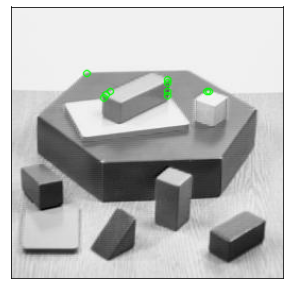

In [98]:
img = cv2.imread('data/corner.jpg', 0)

# Initiate STAR detector
orb = cv2.ORB_create()

# find the keypoints with ORB
kp = orb.detect(img, None)

# compute the descriptors with ORB
kp, des = orb.compute(img, kp)
print(f'kp_num: {len(kp)}')
print(f'des.shape: {des.shape}')

# draw only keypoints location,not size and orientation
img2 = cv2.drawKeypoints(img, kp[:10], None, color=(0, 255, 0), flags=0)
show_(img2)

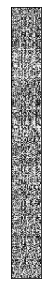

In [99]:
show_(des)

## [Feature Matching 特徵點匹配](https://docs.opencv.org/4.2.0/dc/dc3/tutorial_py_matcher.html)

### [`cv2.BFMatcher(normType(int), crossCheck (bool))`](https://docs.opencv.org/4.2.0/d3/da1/classcv_1_1BFMatcher.html)
* [normType](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#gad12cefbcb5291cf958a85b4b67b6149f)
* `crossCheck`: 預設`False`
* `bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
` 創建一個BF-Matcher 物件
    * `bf.match()`
    * `bf.knnMatch()`
* `matches = bf.match(des1, des2)` matches物件的屬性
    * `.distance` 描述向量的距離 越小越好
    * `.trainIdx` 目標圖像描述向量的index
    * `.queryIdx` 查詢圖像描述向量的index
    * `.imgIdx` 目標圖像的index (0)

### [`cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches1to2, outImg,  matchColor, singlePointColor, matchesMask, flags)`](https://docs.opencv.org/4.2.0/d4/d5d/group__features2d__draw.html#gad8f463ccaf0dc6f61083abd8717c261a) 
* [`flags`](https://docs.opencv.org/4.2.0/d4/d5d/group__features2d__draw.html#gga2c2ede79cd5141534ae70a3fd9f324c8a5b39c8b553c821e7cddc6da64b5bd2ee)



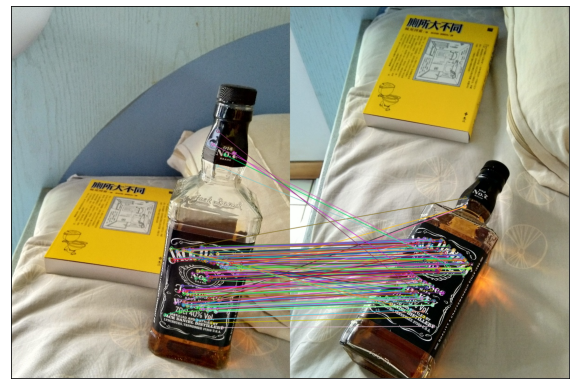

In [100]:
img1 = cv2.imread('data/JD1.jpg')
img2 = cv2.imread('data/JD2.jpg')
orb = cv2.ORB_create()

# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1, des2)

# Sort them in the order of their distance.
matches = sorted(matches, key=lambda x: x.distance)

# Draw first 10 matches.
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:200], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
show_(img3, 10)


## FLANN based Matcher
### [`cv2.FlannBasedMatcher(indexParams, searchParams)`](https://docs.opencv.org/4.2.0/dc/de2/classcv_1_1FlannBasedMatcher.html)

## [Feature Matching + Homography to find Objects 尋找物件(暫時跳過)](https://docs.opencv.org/4.2.0/d1/de0/tutorial_py_feature_homography.html)

In [101]:
# wait

### 人臉辨識

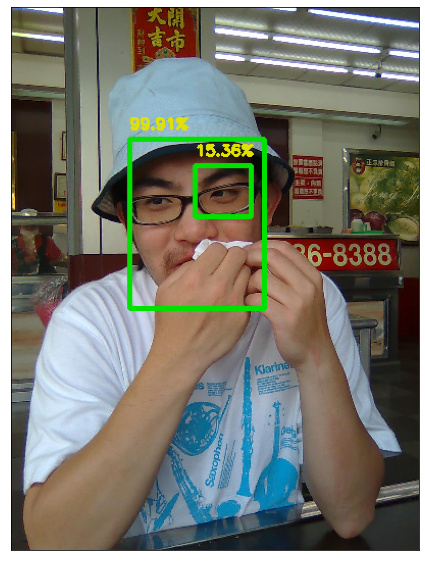

In [102]:
image = cv2.imread('data/pool.jpg')
h, w = image.shape[:2]
r = h / w
w = 400
h = int(r * w)
image = cv2.resize(image, (w, h), interpolation=cv2.INTER_CUBIC)

# 導入模型和設定
net = cv2.dnn.readNetFromCaffe('data/deploy.prototxt.txt', 'data/face_detection.caffemodel')
blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))

# pass the blob through the network and obtain the detections and
# predictions
net.setInput(blob)
detections = net.forward()

# loop over the detections
for i in range(0, detections.shape[2]):
    # extract the confidence (i.e., probability) associated with the
    # prediction
    confidence = detections[0, 0, i, 2]

    # filter out weak detections by ensuring the `confidence` is
    # greater than the minimum confidence
    # 機率大於多少畫框框
    if confidence > 0.15:
        # compute the (x, y)-coordinates of the bounding box for the
        # object
        box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
        (startX, startY, endX, endY) = box.astype("int")

        # draw the bounding box of the face along with the associated
        # probability
        text = "{:.2f}%".format(confidence * 100)
        y = startY - 10 if startY - 10 > 10 else startY + 10
        cv2.rectangle(image, (startX, startY), (endX, endY), (0, 225, 0), 3)
        cv2.putText(image, text, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 225, 225), 2)

# show the output image
show_(image, 10)

# 影片處理
### [`cv2.VideoCapture(index(int), filename)`](https://docs.opencv.org/4.2.0/d8/dfe/classcv_1_1VideoCapture.html)
* `cv2.VideoCapture(0)` 預設攝影機
* `cv2.VideoCapture(filename)` 打開影片檔案
* `cap = cv2.VideoCapture(file_name)`
* `frame` (np.array) 畫面 沒有輸出None
* `cap.isOpened()` (bool) 檢查初始化是復成功
* `cap.open(filename)` 可以重新開啟檔案
* `ret, frame = cap.read()` 一次讀取一幀
* `ret` bool 有沒有資料(讀取正確)
* `cap.get(propId)` propId(0~18) 取得影片的屬性
    * [__propId__](https://docs.opencv.org/4.2.0/d4/d15/group__videoio__flags__base.html#gaeb8dd9c89c10a5c63c139bf7c4f5704d)

|id|---|影片|相機|
|---|:---|---|---|
|0|影片當前位置(ms)|v|v|
|1|影片當下幀的index(float)|v|-1|
|2|影片相對位置(0~1)|v|-1|
|3|寬度|v|v|
|4|高度|v|v|
|5|幀數(FPS)|v|v|
|6|解碼器的4位字符|||
|7|影片幀數(總幀數)|v|-1|
|10|亮度|0|v|
|11|對比度|0|v|
|12|飽和度|0|v|
|13|色相|0|v|

* `cap.set(propId, value)` 設定新的屬性
* `cap.release()` 關閉

### [`cv2.VideoWriter(filename, fourcc, fps, frameSize, isColor(bool))`](https://docs.opencv.org/4.2.0/dd/d9e/classcv_1_1VideoWriter.html)
* [`fourcc`](http://www.fourcc.org/codecs.php) 編碼形式 (四節字碼)
* `fourcc = cv2.VideoWriter_fourcc(*'XVID')`
* `out = cv2.VideoWriter('file_name', fourcc, fps(int), size(640, 480))`

In [103]:
cap = cv2.VideoCapture(0) # 設定0 筆電攝影機
if not cap.isOpened():
    print("Cannot open camera")
    
while True:
    # Capture frame-by-frame
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if ret: # ret == True
        # 上文字
        t = 'time: ' + str(cap.get(0) // 1000)
        fps = 'fps: '+ str(cap.get(5))
        w = 'w: ' + str(cap.get(3))
        h = 'h: ' + str(cap.get(4))
        font = cv2.FONT_HERSHEY_SIMPLEX
        texts = [t, fps, w, h]
        for i in range(4):
            cv2.putText(frame, texts[i], (10, (i + 1) * 30), font, 0.8, (0, 255, 0), 2, cv2.LINE_AA)
    
        # Display the resulting frame
        cv2.imshow('frame', frame)
        if cv2.waitKey(10) & 0xFF == ord('q'): # q 退出
            break
    else:
        print("Can't receive frame (stream end?). Exiting ...")
        break
        
# When everything done, release the capture
cap.release() # 關閉攝影積
cv2.destroyAllWindows()

In [104]:
cap = cv2.VideoCapture('data/soupO.mp4')
while cap.isOpened():
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break
        
    # 上文字
    t = 'time: ' + str(round(cap.get(0) / 1000, 1))
    fps = 'fps: '+ str(cap.get(5))
    w = 'w: ' + str(cap.get(3))
    h = 'h: ' + str(cap.get(4))
    font = cv2.FONT_HERSHEY_SIMPLEX
    texts = [t, fps, w, h]
    for i in range(4):
        cv2.putText(frame, texts[i], (10, (i + 1) * 30), font, 0.8, (0, 255, 0), 2, cv2.LINE_AA)
    
    cv2.imshow('frame', frame)
    if cv2.waitKey(40) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

In [105]:
for i in [i for i in dir(cv2) if i.startswith('COLOR_BGR2')]:
    print(i)

COLOR_BGR2BGR555
COLOR_BGR2BGR565
COLOR_BGR2BGRA
COLOR_BGR2GRAY
COLOR_BGR2HLS
COLOR_BGR2HLS_FULL
COLOR_BGR2HSV
COLOR_BGR2HSV_FULL
COLOR_BGR2LAB
COLOR_BGR2LUV
COLOR_BGR2Lab
COLOR_BGR2Luv
COLOR_BGR2RGB
COLOR_BGR2RGBA
COLOR_BGR2XYZ
COLOR_BGR2YCR_CB
COLOR_BGR2YCrCb
COLOR_BGR2YUV
COLOR_BGR2YUV_I420
COLOR_BGR2YUV_IYUV
COLOR_BGR2YUV_YV12


### [`cv2.inRange(img, lower_val, upper_val)`](https://docs.opencv.org/4.2.0/d2/de8/group__core__array.html#ga48af0ab51e36436c5d04340e036ce981)
* 輸出mask uint8 (0 or 255)
* lower_val < img < upper_val
* 條件內 255, 條件外 0

In [106]:
arr = np.arange(10).reshape(5, 1, 2)
print(arr)

cv2.inRange(arr, (0, 3), (6, 9))

[[[0 1]]

 [[2 3]]

 [[4 5]]

 [[6 7]]

 [[8 9]]]


array([[  0],
       [255],
       [255],
       [255],
       [  0]], dtype=uint8)

In [107]:
# 顯示藍色的物體!!
cap = cv2.VideoCapture(0)
while cap.isOpened():
    # Take each frame
    _, frame = cap.read()
    
    # Convert BGR to HSV
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    
    # define range of blue color in HSV # 轉換成HSV方便找到顏色
    lower_blue = np.array([70, 30, 30])
    upper_blue = np.array([160, 255, 255])
    
    # Threshold the HSV image to get only blue colors
    mask = cv2.inRange(hsv, lower_blue, upper_blue)
    
    # Bitwise-AND mask and original image
    res = cv2.bitwise_and(frame, frame, mask=mask)
    cv2.imshow('frame', frame)
    cv2.imshow('mask', mask)
    cv2.imshow('res', res)
    k = cv2.waitKey(20) & 0xFF
    if k == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

## [How to Use Background Subtraction Methods](https://docs.opencv.org/4.2.0/d1/dc5/tutorial_background_subtraction.html)
* ![](https://docs.opencv.org/4.2.0/Background_Subtraction_Tutorial_Scheme.png)

### [`cv2.createBackgroundSubtractorKNN`](https://docs.opencv.org/4.2.0/de/de1/group__video__motion.html#gac9be925771f805b6fdb614ec2292006d)

### [`cv2.createBackgroundSubtractorMOG2`](https://docs.opencv.org/4.2.0/de/de1/group__video__motion.html#gac9be925771f805b6fdb614ec2292006d)

In [108]:
# backSub = cv2.createBackgroundSubtractorKNN()
backSub = cv2.createBackgroundSubtractorMOG2()

cap = cv2.VideoCapture(0)
while cap.isOpened():
    ret, frame = cap.read()
    if frame is None:
        print('break')
        break
    fgMask = backSub.apply(frame)

    cv2.rectangle(frame, (10, 2), (100, 20), (255, 255, 255), -1)
#     cv2.putText(frame, str(cap.get(cv2.CAP_PROP_POS_FRAMES)), (15, 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0))

    cv2.imshow('Frame', frame)
    cv2.imshow('FG Mask', fgMask)

    if cv2.waitKey(20) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

## [Meanshift and Camshift 跟蹤追蹤目標](https://docs.opencv.org/4.2.0/d7/d00/tutorial_meanshift.html)

## [Meanshift](https://www.biaodianfu.com/mean-shift.html)
### [`cv2.meanShift(img, window(x, y, w, h), criteria)`](https://docs.opencv.org/4.2.0/dc/d6b/group__video__track.html#ga432a563c94eaf179533ff1e83dbb65ea)

In [109]:
cap = cv2.VideoCapture('data/slow_traffic.mp4')
fps = cap.get(cv2.CAP_PROP_FPS)
wait_ = round(1000 / fps)

# take first frame of the video
ret, frame = cap.read()

# setup initial location of window
x, y, w, h = 300, 190, 90, 60  # simply hardcoded the values
track_window = (x, y, w, h)

# set up the ROI for tracking
roi = frame[y:y + h, x:x + w]
hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsv_roi, (0, 0, 150), (180, 100, 255)) # 白色的過濾
# show_(mask)
roi_hist = cv2.calcHist([hsv_roi], [1, 2], mask, [255, 255], [0, 255, 0, 255])
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
roi_hist = cv2.filter2D(roi_hist, -1, kernel) # 模糊化 讓附近比的比較容易抓到
cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX) # 線性縮放 0~255
# show_(roi_hist)

# Setup the termination criteria, either 10 iteration or move by atleast 1 pt
term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print('end')
        break
        
    if cv2.waitKey(wait_) & 0xFF == ord('q'):
        break
        
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    dst = cv2.calcBackProject([hsv], [1, 2], roi_hist, [0, 255, 0, 255], 1)
    cv2.imshow('dst', dst)

    # apply meanshift to get the new location
    ret, track_window = cv2.meanShift(dst, track_window, term_crit)

    # Draw it on image
    x, y, w, h = track_window
    img2 = cv2.rectangle(frame, (x, y), (x + w, y + h), (25, 255, 25), 2)
    cv2.putText(img2, f'x:{x}, y:{y}, w:{w}, h:{h}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2, cv2.LINE_AA)
    cv2.imshow('img2', img2)

cap.release()
cv2.destroyAllWindows()

## Camshift

### [`cv2.CamShift(img, window(x, y, w, h), criteria)`](https://docs.opencv.org/4.2.0/dc/d6b/group__video__track.html#gaef2bd39c8356f423124f1fe7c44d54a1)

In [110]:
cap = cv2.VideoCapture('data/slow_traffic.mp4')
fps = cap.get(cv2.CAP_PROP_FPS)
wait_ = round(1000 / fps)

# take first frame of the video
ret, frame = cap.read()

# setup initial location of window
x, y, w, h = 300, 190, 90, 60  # simply hardcoded the values
track_window = (x, y, w, h)

# set up the ROI for tracking
roi = frame[y:y + h, x:x + w]
hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsv_roi, (0, 0, 150), (180, 100, 255)) # 白色的過濾
# show_(mask)
roi_hist = cv2.calcHist([hsv_roi], [1, 2], mask, [255, 255], [0, 255, 0, 255])
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
roi_hist = cv2.filter2D(roi_hist, -1, kernel) # 模糊化 讓附近比的比較容易抓到
cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX) # 線性縮放 0~255
# show_(roi_hist)

# Setup the termination criteria, either 10 iteration or move by atleast 1 pt
term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print('end')
        break
        
    if cv2.waitKey(wait_) & 0xFF == ord('q'):
        break

    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    dst = cv2.calcBackProject([hsv], [1, 2], roi_hist, [0, 255, 0, 255], 1)
    cv2.imshow('dst', dst)

    # apply camshift to get the new location
    ret, track_window = cv2.CamShift(dst, track_window, term_crit)

    # Draw it on image
    pts = cv2.boxPoints(ret)
    pts = np.int0(pts)
    img2 = cv2.polylines(frame, [pts], True, (0, 255, 0), 2)
    cv2.imshow('img2', img2)

cap.release()
cv2.destroyAllWindows()

### 簡單的藍球追蹤

In [111]:
ball = cv2.imread('data/bule_ball.jpg')
# show_(ball)
ball_hsv = cv2.cvtColor(ball, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(ball_hsv, (70, 150, 100), (160, 255, 255))
# show_(mask)
ball_hist = cv2.calcHist([ball_hsv], [0, 1], mask, [180, 255], [0, 180, 0, 255])
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 15))
ball_hist = cv2.filter2D(ball_hist, -1, kernel) # 模糊化 讓附近比的比較容易抓到
cv2.normalize(ball_hist, ball_hist, 0, 255, cv2.NORM_MINMAX) # 線性縮放 0~255
# show_(ball_hist)

term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)

cap = cv2.VideoCapture(0)
track_window = (100, 100, 100, 100)
while cap.isOpened():
    ret, frame = cap.read()
    if cv2.waitKey(20) & 0xFF == ord('q'):
        break
    
    # Convert BGR to HSV
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    
    # Threshold the HSV image to get only blue colors
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    dst = cv2.calcBackProject([hsv], [0, 1], ball_hist, [0, 180, 0, 255], 1)
    cv2.imshow('dst', dst)
    
    ret, track_window = cv2.CamShift(dst, track_window, term_crit)
    pts = np.int0(pts)
    img2 = cv2.polylines(frame, [pts], True, (0, 255, 255), 2)
    cv2.imshow('frame', frame)


cap.release()
cv2.destroyAllWindows()

## [Optical Flow 光流](https://docs.opencv.org/4.2.0/d4/dee/tutorial_optical_flow.html)

* 跟蹤移動的物體, 移動的方向變成一個連續的向量
* 假設：
    * 物體的灰度值不變
    * 相鄰的像素也有相同的運動軌跡
    * 基於以上假設, 某一像素灰度可以寫成： $I(x,y,t) = I(x+dx, y+dy, t+dt)$

## Lucas-Kanade Optical Flow

### [`cv2.calcOpticalFlowPyrLK(prevImg, nextImg, prevPts, nextPts)`](https://docs.opencv.org/4.2.0/dc/d6b/group__video__track.html#ga473e4b886d0bcc6b65831eb88ed93323)
* prevImg
* nextImg
* prevPts
* nextPts


### [`cv2.goodFeaturesToTrack(img, maxCorners, qualityLevel, minDistance, corners, mask, blockSize, useHarrisDetector, k)`](https://docs.opencv.org/4.2.0/dd/d1a/group__imgproc__feature.html#ga1d6bb77486c8f92d79c8793ad995d541)
* output 回傳前 N 個最好的點位
* `maxCorners`: N (-1 所有的角)
* `qualityLevel`:(float) 質量等級
* `minDistance`: 角度的歐基里得距離
* `mask`: 檢測範圍設定
* `blockSize`: 角檢測需要考慮的大小(u, v ???)
* `useHarrisDetector`: 使用Harris檢測
* `k`: Harris的參數

In [5]:
cap = cv2.VideoCapture('data/slow_traffic.mp4')
fps = cap.get(cv2.CAP_PROP_FPS)
wait_ = round(1000 / fps)

# params for ShiTomasi corner detection & lucas kanade optical flow 
feature_params = {'maxCorners': 100, 'qualityLevel': 0.3, 'minDistance': 7, 'blockSize': 7}
# maxLevel 为使用的图像金字塔层数
lk_params = {'winSize': (15, 15), 'maxLevel': 2, 'criteria': (3, 10, 0.03)}

# Create some random colors
color = np.random.randint(0, 255, size=(100, 3))

# Take first frame and find corners in it
ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY) # 轉灰度
p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(old_frame)
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print('end')
        break
        
    if cv2.waitKey(wait_) & 0xFF == ord('q'):
        break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # calculate optical flow
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)
    # Select good points
    good_new = p1[st == 1]
    good_old = p0[st == 1]
    # draw the tracks
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.ravel()
        c, d = old.ravel()
        mask = cv2.line(mask, (a, b), (c, d), color[i].tolist(), 2)
        frame = cv2.circle(frame, (a, b), 5, color[i].tolist(), -1)
    img = cv2.add(frame, mask)
    cv2.imshow('frame', img)
    # Now update the previous frame and previous points
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1, 1, 2)


cap.release()
cv2.destroyAllWindows()

error: OpenCV(4.5.5) :-1: error: (-5:Bad argument) in function 'line'
> Overload resolution failed:
>  - Can't parse 'pt1'. Sequence item with index 0 has a wrong type
>  - Can't parse 'pt1'. Sequence item with index 0 has a wrong type


### Dense Optical Flow

In [ ]:
cap = cv2.VideoCapture('data/vtest.avi')
fps = cap.get(cv2.CAP_PROP_FPS)
wait_ = round(1000 / fps)

ret, frame1 = cap.read()
prvs = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
hsv = np.zeros_like(frame1)
hsv[..., 1] = 255 # arr[..., i or i:j] 取後段
while cap.isOpened():
    ret, frame2 = cap.read()
    if not ret:
        print('end')
        break
        
    if cv2.waitKey(wait_) & 0xFF == ord('q'):
        break
    cv2.imshow('frame2', frame2)
    next = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    flow = cv2.calcOpticalFlowFarneback(
        prvs, next, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang * 180 / np.pi / 2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    cv2.imshow('bgr', bgr)
    k = cv2.waitKey(20) & 0xff
    if k == ord('q'):
        break
    elif k == ord('s'):
        cv2.imwrite('opticalfb.png', frame2)
        cv2.imwrite('opticalhsv.png', bgr)
    prvs = next

cap.release()
cv2.destroyAllWindows()

# 攝影機標定和3D重構

## [攝影機標定](https://docs.opencv.org/4.2.0/dc/dbb/tutorial_py_calibration.html)

# 程式效率

* cv2.getTickCount() 時間(單位)
* cv2.getTickFrequency() 一秒幾時間單位

```python
t1 = cv2.getTickCount()
# your code
t2 = cv2.getTickCount()
time = (t2 - t1) / cv2.getTickFrequency()
```

### 程式優化 OpenCV 內建都是開啟優化
* `cv2.useOptimized()` 可以查看是否開啟優化
* 一般來說OpenCV的函數比Numpy函數快, 但Numpy對索引比較擅長

In [ ]:
t = cv2.getTickCount()
time.sleep(1)
(cv2.getTickCount() - t) / cv2.getTickFrequency()


1.001250946

In [ ]:
t = time.time()
time.sleep(1)
time.time() - t

1.0017828941345215

In [ ]:
cv2.useOptimized()

True